In [2]:
from sklearn.model_selection import train_test_split,RepeatedKFold
from fancyimpute import MICE # imputation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve,cross_val_score,GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.linear_model import RidgeCV
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# download data and scrub

url = 'https://github.com/GinoWoz1/AdvancedHousePrices/raw/master/'
 
df_train = pd.read_csv(url + 'train.csv')
df_test = pd.read_csv(url +'test.csv')
df_train.columns.to_series().groupby(df_train.dtypes).groups

# Split data set into test and train
ntrain = df_train.shape[0]
ntest = df_test.shape[0]
y_train = df_train.SalePrice.values
all_data = pd.concat((df_train, df_test)).reset_index(drop=True)
all_data.drop(['SalePrice'], axis=1, inplace=True)


# fill in missing data

all_data['PoolQC'] = all_data['PoolQC'].fillna("None")
all_data["MiscFeature"] = all_data["MiscFeature"].fillna("None")
all_data["Alley"] = all_data["Alley"].fillna("None")
all_data["Fence"] = all_data["Fence"].fillna("None")
all_data["FireplaceQu"] = all_data["FireplaceQu"].fillna("None")

#fill in missing data for garage, basement and mason area

for col in ('GarageType', 'GarageFinish', 'GarageQual', 'GarageCond'):
    all_data[col] = all_data[col].fillna('None')

for col in ( 'GarageArea', 'GarageCars'):
    all_data[col] = all_data[col].fillna(0)
    
for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
    all_data[col] = all_data[col].fillna('None')
    
for col in ('BsmtHalfBath', 'BsmtFullBath', 'TotalBsmtSF', 'BsmtUnfSF', 'BsmtFinSF1','BsmtFinSF2'):
    all_data[col] = all_data[col].fillna(0)


all_data["MasVnrType"] = all_data["MasVnrType"].fillna("None")
all_data["MasVnrArea"] = all_data["MasVnrArea"].fillna(0)
all_data["GarageYrBlt"] = all_data.groupby("Neighborhood")["GarageYrBlt"].transform( lambda x: x.fillna(x.mean()))

# fill in MSzoning values based on knowlege of data
    
all_data.loc[2216,'MSZoning'] = 'RM'
all_data.loc[2904,'MSZoning'] = 'RM'
all_data.loc[1915,'MSZoning'] = 'RM'
all_data.loc[2250,'MSZoning'] = 'RM'
all_data.loc[1915,'Utilities'] = 'AllPub'
all_data.loc[1945,'Utilities'] = 'AllPub'
all_data.loc[2473,'Functional'] = 'Typ'
all_data.loc[2216,'Functional'] = 'Typ'
all_data.loc[2489,'SaleType'] = 'WD'
all_data.loc[2151,'Exterior1st'] = 'Plywood'
all_data.loc[2151,'Exterior2nd'] = 'Plywood'
all_data.loc[1379,'Electrical'] = 'SBrkr'

all_data['MSSubClass'] = all_data['MSSubClass'].apply(str)

# analyze which neighborhoods have null data

all_data[pd.isna(all_data['LotFrontage'])].groupby("Neighborhood").size().sort_values(ascending = False)

# evaluation metrics and model vetting function

train = all_data[:ntrain]
test = all_data[ntrain:]
y_train = df_train.SalePrice

numeric_data_train = train.select_dtypes(include = ['float64','int64'])
solver=MICE()
Imputed_dataframe_train= pd.DataFrame(data = solver.complete(numeric_data_train),columns = numeric_data_train.columns,index = numeric_data_train.index)
numeric_data_test = test.select_dtypes(include = ['float64','int64'])
solver=MICE()
Imputed_dataframe_test= pd.DataFrame(data = solver.complete(numeric_data_test),columns = numeric_data_test.columns,index = numeric_data_test.index)

train['LotFrontage'] = Imputed_dataframe_train['LotFrontage']
test['LotFrontage'] = Imputed_dataframe_test['LotFrontage']

X_train= pd.get_dummies(train,drop_first=True)
X_test = pd.get_dummies(test,drop_first=True)

In [4]:
# get dummies, select columns with above 0 mutual information

X_train= pd.get_dummies(train,drop_first=True)
X_test = pd.get_dummies(test,drop_first=True)

X_train = X_train[['OverallQual'	,'GarageCars'	,'TotalBsmtSF'	,'GrLivArea'	,'GarageArea'	,'FullBath'	,'YearBuilt'	,'GarageYrBlt'	,'ExterQual_TA'	,'1stFlrSF'	,'KitchenQual_TA'	,'LotFrontage'	,'ExterQual_Gd'	,'Foundation_PConc'	,'TotRmsAbvGrd'	,'KitchenQual_Gd'	,'YearRemodAdd'	,'BsmtQual_Gd'	,'Fireplaces'	,'BsmtFinSF1'	,'BsmtQual_TA'	,'FireplaceQu_None'	,'GarageFinish_Unf'	,'GarageType_Attchd'	,'BsmtUnfSF'	,'GarageType_Detchd'	,'MSSubClass_60'	,'2ndFlrSF'	,'OverallCond'	,'BsmtFinType1_GLQ'	,'Foundation_CBlock'	,'Exterior1st_VinylSd'	,'LotShape_Reg'	,'MSSubClass_30'	,'HeatingQC_TA'	,'LotArea'	,'MasVnrArea'	,'MasVnrType_None'	,'Neighborhood_NAmes'	,'MSZoning_RM'	,'CentralAir_Y'	,'SaleCondition_Partial'	,'GarageQual_None'	,'HalfBath'	,'GarageFinish_RFn'	,'FireplaceQu_Gd'	,'Neighborhood_NridgHt'	,'GarageQual_TA'	,'HouseStyle_2Story'	,'FireplaceQu_TA'	,'WoodDeckSF'	,'PavedDrive_Y'	,'GarageCond_TA'	,'Neighborhood_NoRidge'	,'MSZoning_RL'	,'SaleType_WD'	,'BedroomAbvGr'	,'Electrical_SBrkr'	,'MasVnrType_Stone'	,'Neighborhood_Somerst'	,'Neighborhood_CollgCr'	,'OpenPorchSF'	,'PoolQC_None'	,'BsmtExposure_Gd'	,'Neighborhood_Gilbert'	,'Street_Pave'	,'Neighborhood_OldTown'	,'KitchenAbvGr'	,'BsmtExposure_No'	,'YrSold'	,'Fence_MnPrv'	,'MSZoning_FV'	,'MasVnrType_BrkFace'	,'Neighborhood_MeadowV'	,'Exterior1st_Wd Sdng'	,'EnclosedPorch'	,'BsmtCond_Gd'	,'Exterior2nd_Wd Sdng'	,'KitchenQual_Fa'	,'BsmtFinType1_Rec'	,'BsmtFinSF2'	,'MSSubClass_160'	,'Exterior1st_CemntBd'	,'Neighborhood_ClearCr'	,'Neighborhood_BrkSide'	,'RoofStyle_Hip'	,'Neighborhood_IDOTRR'	,'GarageType_BuiltIn'	,'MSSubClass_50'	,'Neighborhood_StoneBr'	,'HeatingQC_Gd'	,'Neighborhood_Sawyer'	,'PavedDrive_P'	,'Fence_None'	,'HouseStyle_SFoyer'	,'GarageCond_Fa'	,'SaleCondition_Normal'	,'MSSubClass_45'	,'Functional_Typ'	,'LotConfig_Inside'	,'Exterior1st_MetalSd'	,'Electrical_FuseF'	,'Exterior1st_HdBoard'	,'BsmtQual_Fa'	,'HeatingQC_Fa'	,'Exterior2nd_Plywood'	,'ExterCond_TA'	,'BldgType_Duplex'	,'LotConfig_CulDSac'	,'Alley_None'	,'LotShape_IR2'	,'Neighborhood_Edwards'	,'BsmtFinType2_BLQ'	,'RoofStyle_Gable'	,'GarageCond_Po'	,'Functional_Min2'	,'LandSlope_Mod'	,'ScreenPorch'	,'ExterQual_Fa'	,'Neighborhood_SawyerW'	,'FireplaceQu_Po'	,'LandContour_Lvl'	,'MSSubClass_40'	,'LandContour_HLS'	,'RoofMatl_Tar&Grv'	,'SaleType_ConLw'	,'BsmtExposure_None'	,'Neighborhood_BrDale'	,'RoofStyle_Mansard'	,'MiscVal'	,'BldgType_TwnhsE'	,'Alley_Pave'	,'Exterior1st_WdShing'	,'GarageType_CarPort'	,'Fence_GdWo'	,'Exterior1st_BrkFace'	,'Condition2_Norm'	,'BsmtFinType1_Unf'	,'Heating_Grav'	,'HouseStyle_SLvl'	,'Foundation_Slab'	,'BsmtExposure_Mn'	,'MSSubClass_70'	,'BsmtFinType2_Rec'	,'Condition1_RRAe'	,'Exterior2nd_BrkFace'	,'HouseStyle_1.5Unf'	,'Neighborhood_Mitchel'	,'Electrical_FuseP'	,'Neighborhood_NWAmes'	,'MSSubClass_180'	,'HouseStyle_2.5Unf'	,'RoofStyle_Shed'	,'BsmtFinType2_GLQ'	,'LandSlope_Sev'	,'MSSubClass_85'	,'LotConfig_FR3'	,'LotConfig_FR2'	,'RoofMatl_WdShngl'	,'BsmtHalfBath'	,'Neighborhood_Blueste'	,'Exterior1st_BrkComm'	,'Neighborhood_Timber'	,'Condition1_Norm'	,'Neighborhood_SWISU'	,'BldgType_2fmCon'	,'Neighborhood_Veenker'	,'Condition1_PosA'	,'SaleCondition_Alloca'	,'SaleType_ConLD'	,'3SsnPorch'	,'LotShape_IR3'	,'Condition1_PosN'	,'BsmtFinType1_LwQ'	,'BsmtFinType1_BLQ'	,'MSZoning_RH'	,'Neighborhood_NPkVill'	,'FireplaceQu_Fa']]
X_test = X_test[['OverallQual'	,'GarageCars'	,'TotalBsmtSF'	,'GrLivArea'	,'GarageArea'	,'FullBath'	,'YearBuilt'	,'GarageYrBlt'	,'ExterQual_TA'	,'1stFlrSF'	,'KitchenQual_TA'	,'LotFrontage'	,'ExterQual_Gd'	,'Foundation_PConc'	,'TotRmsAbvGrd'	,'KitchenQual_Gd'	,'YearRemodAdd'	,'BsmtQual_Gd'	,'Fireplaces'	,'BsmtFinSF1'	,'BsmtQual_TA'	,'FireplaceQu_None'	,'GarageFinish_Unf'	,'GarageType_Attchd'	,'BsmtUnfSF'	,'GarageType_Detchd'	,'MSSubClass_60'	,'2ndFlrSF'	,'OverallCond'	,'BsmtFinType1_GLQ'	,'Foundation_CBlock'	,'Exterior1st_VinylSd'	,'LotShape_Reg'	,'MSSubClass_30'	,'HeatingQC_TA'	,'LotArea'	,'MasVnrArea'	,'MasVnrType_None'	,'Neighborhood_NAmes'	,'MSZoning_RM'	,'CentralAir_Y'	,'SaleCondition_Partial'	,'GarageQual_None'	,'HalfBath'	,'GarageFinish_RFn'	,'FireplaceQu_Gd'	,'Neighborhood_NridgHt'	,'GarageQual_TA'	,'HouseStyle_2Story'	,'FireplaceQu_TA'	,'WoodDeckSF'	,'PavedDrive_Y'	,'GarageCond_TA'	,'Neighborhood_NoRidge'	,'MSZoning_RL'	,'SaleType_WD'	,'BedroomAbvGr'	,'Electrical_SBrkr'	,'MasVnrType_Stone'	,'Neighborhood_Somerst'	,'Neighborhood_CollgCr'	,'OpenPorchSF'	,'PoolQC_None'	,'BsmtExposure_Gd'	,'Neighborhood_Gilbert'	,'Street_Pave'	,'Neighborhood_OldTown'	,'KitchenAbvGr'	,'BsmtExposure_No'	,'YrSold'	,'Fence_MnPrv'	,'MSZoning_FV'	,'MasVnrType_BrkFace'	,'Neighborhood_MeadowV'	,'Exterior1st_Wd Sdng'	,'EnclosedPorch'	,'BsmtCond_Gd'	,'Exterior2nd_Wd Sdng'	,'KitchenQual_Fa'	,'BsmtFinType1_Rec'	,'BsmtFinSF2'	,'MSSubClass_160'	,'Exterior1st_CemntBd'	,'Neighborhood_ClearCr'	,'Neighborhood_BrkSide'	,'RoofStyle_Hip'	,'Neighborhood_IDOTRR'	,'GarageType_BuiltIn'	,'MSSubClass_50'	,'Neighborhood_StoneBr'	,'HeatingQC_Gd'	,'Neighborhood_Sawyer'	,'PavedDrive_P'	,'Fence_None'	,'HouseStyle_SFoyer'	,'GarageCond_Fa'	,'SaleCondition_Normal'	,'MSSubClass_45'	,'Functional_Typ'	,'LotConfig_Inside'	,'Exterior1st_MetalSd'	,'Electrical_FuseF'	,'Exterior1st_HdBoard'	,'BsmtQual_Fa'	,'HeatingQC_Fa'	,'Exterior2nd_Plywood'	,'ExterCond_TA'	,'BldgType_Duplex'	,'LotConfig_CulDSac'	,'Alley_None'	,'LotShape_IR2'	,'Neighborhood_Edwards'	,'BsmtFinType2_BLQ'	,'RoofStyle_Gable'	,'GarageCond_Po'	,'Functional_Min2'	,'LandSlope_Mod'	,'ScreenPorch'	,'ExterQual_Fa'	,'Neighborhood_SawyerW'	,'FireplaceQu_Po'	,'LandContour_Lvl'	,'MSSubClass_40'	,'LandContour_HLS'	,'RoofMatl_Tar&Grv'	,'SaleType_ConLw'	,'BsmtExposure_None'	,'Neighborhood_BrDale'	,'RoofStyle_Mansard'	,'MiscVal'	,'BldgType_TwnhsE'	,'Alley_Pave'	,'Exterior1st_WdShing'	,'GarageType_CarPort'	,'Fence_GdWo'	,'Exterior1st_BrkFace'	,'Condition2_Norm'	,'BsmtFinType1_Unf'	,'Heating_Grav'	,'HouseStyle_SLvl'	,'Foundation_Slab'	,'BsmtExposure_Mn'	,'MSSubClass_70'	,'BsmtFinType2_Rec'	,'Condition1_RRAe'	,'Exterior2nd_BrkFace'	,'HouseStyle_1.5Unf'	,'Neighborhood_Mitchel'	,'Electrical_FuseP'	,'Neighborhood_NWAmes'	,'MSSubClass_180'	,'HouseStyle_2.5Unf'	,'RoofStyle_Shed'	,'BsmtFinType2_GLQ'	,'LandSlope_Sev'	,'MSSubClass_85'	,'LotConfig_FR3'	,'LotConfig_FR2'	,'RoofMatl_WdShngl'	,'BsmtHalfBath'	,'Neighborhood_Blueste'	,'Exterior1st_BrkComm'	,'Neighborhood_Timber'	,'Condition1_Norm'	,'Neighborhood_SWISU'	,'BldgType_2fmCon'	,'Neighborhood_Veenker'	,'Condition1_PosA'	,'SaleCondition_Alloca'	,'SaleType_ConLD'	,'3SsnPorch'	,'LotShape_IR3'	,'Condition1_PosN'	,'BsmtFinType1_LwQ'	,'BsmtFinType1_BLQ'	,'MSZoning_RH'	,'Neighborhood_NPkVill'	,'FireplaceQu_Fa']]

remove = ['BsmtQual_None','Exterior2nd_MetalSd','BsmtFinType1_None','MSSubClass_90','BsmtCond_None','BsmtEpoxsure_None','BsmtFinType2_None','GarageFinish_None','GarageCond_None','GarageType_None','MSSubClass_190','MSSubClass_80','Exterior2nd_CmentBd','SaleType_New','Exterior2nd_VinylSd']

def drop_cols(dataframe,columns_remove):
    cols =list(dataframe.columns.values)
    for col in columns_remove:
        for c in cols:
            if c == col:
                cols.remove(c)
            elif c != col:
                continue
    dataframe = dataframe[cols]
    return dataframe


X_train = drop_cols(X_train,remove)
X_test = drop_cols(X_test,remove)

# set scoring functions

def rmsle(y_true, y_pred): 
    assert len(y_true) == len(y_pred)
    return np.sqrt(np.mean((np.log(1+y_pred) - np.log(1+y_true))**2))


def rmsle_cv(y_true, y_pred) : 
    assert len(y_true) == len(y_pred)
    if not (y_true >= 0).all() and not (y_pred >= 0).all():
        raise ValueError("Mean Squared Logarithmic Error cannot be used when "
                         "targets contain negative values.")
    return np.sqrt(np.mean((np.log(1+y_pred) - np.log(1+y_true))**2))

rmsle_cv = make_scorer(rmsle_cv,greater_is_better=False)   

In [5]:
def TrainRegress(model,scorer,sigma,param_grid=[], X=[], y=[], splits=5, repeats=5):
    # create cross-validation method
    rkfold = RepeatedKFold(n_splits=splits, n_repeats=repeats)
    
    # perform a grid search if param_grid given
    if len(param_grid)>0:
        # setup grid search parameters
        gsearch = GridSearchCV(model, param_grid, cv=rkfold,
                               scoring=scorer,
                               verbose=1, return_train_score=True)

        # search the grid
        gsearch.fit(X,y)

        # extract best model from the grid
        model = gsearch.best_estimator_        
        best_idx = gsearch.best_index_

        # get cv-scores for best model
        grid_results = pd.DataFrame(gsearch.cv_results_)       
        cv_mean = abs(grid_results.loc[best_idx,'mean_test_score'])
        cv_std = grid_results.loc[best_idx,'std_test_score']

    # no grid search, just cross-val score for given model    
    else:
        grid_results = []
        cv_results = cross_val_score(model, X, y, scoring=scorer, cv=rkfold)
        cv_mean = abs(np.mean(cv_results))
        cv_std = np.std(cv_results)
    
    # combine mean and std cv-score in to a pandas series
    cv_score = pd.Series({'mean':cv_mean,'std':cv_std})

    # predict y using the fitted model
    y_pred = model.predict(X)
    
    
    # print stats on model performance         
    print('----------------------')
    print(model)
    print('----------------------')
    print('cross_val: mean=',cv_mean,', std=',cv_std)

    # residual plots
    y_pred = pd.Series(y_pred,index=y.index)
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()
    z = (resid - mean_resid)/std_resid    
    n_outliers = sum(abs(z)>sigma)
    outliers = z[abs(z)>sigma].index
    print(len(outliers),'outliers:')
    print(outliers.tolist())
        
    
    plt.figure(figsize=(15,15))
    ax_131 = plt.subplot(221)
    plt.plot(y,y_pred,'.')
    plt.ylim(top= 550000)
    plt.ylim(bottom=0)
    plt.xlim(xmax= 550000)
    plt.xlim(xmin=0)
    ax_131.plot([0, 1], [0, 1], transform=ax_131.transAxes)
    plt.xlabel('y')
    plt.ylabel('y_pred');
    plt.title('corr = {:.3f}'.format(np.corrcoef(y,y_pred)[0][1]))
    ax_132=plt.subplot(222)
    plt.plot(y,y-y_pred,'.')
    plt.ylim(bottom=-75000)
    plt.ylim(top=75000)
    plt.xlabel('y')
    plt.ylabel('y - y_pred');
    plt.title('std resid = {:.3f}'.format(std_resid))
    
    ax_133=plt.subplot(223)
    z.plot.hist(bins=50,ax=ax_133)
    plt.xlabel('z')
    plt.xlim(xmax = 10)
    plt.xlim(xmin=-10)
    plt.title('{:.0f} samples with z>3'.format(n_outliers))
    df_outliers = X.copy()
    df_outliers['Target'] = y
    df_outliers['Prediction'] = y_pred
    df_outliers['Residual'] = resid
    df_outliers['Outlier'] = 0
    for index in outliers.tolist():
        df_outliers.loc[index,'Outlier'] = 1
    ax_211 = plt.subplot(224)
    train_sizes,train_scores,test_scores = learning_curve(estimator=model,X=X,y=y,train_sizes=np.linspace(0.1,1.0,10),cv=rkfold,n_jobs=1)
    train_mean = np.mean(train_scores,axis=1)
    train_std = np.std(train_scores,axis=1)
    test_mean = np.mean(test_scores,axis=1)
    test_std = np.std(test_scores,axis=1)
    plt.plot(train_sizes,train_mean,color = 'blue',marker='o',markersize=5,label='training accuracy')
    plt.fill_between(train_sizes,train_mean + train_std,train_mean - train_std,alpha=0.15,color='blue')
    plt.plot(train_sizes,test_mean,color='green',linestyle='--',marker='s',markersize=5,label='validation accuracy')
    plt.fill_between(train_sizes,test_mean + test_std,test_mean - test_std,alpha=0.15,color='blue')
    plt.grid()
    plt.xlabel('Number of training samples')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')
    plt.ylim([0.5,1.1])
    plt.show()
    
    return model, cv_score, grid_results,df_outliers

In [6]:
# define train and predict functions

def fit_train(m,X_train,y_train,model,score_frame):
    m.fit(X_train,y_train)
    opt_models[model],cv_score,grid_results,df_outliers = TrainRegress(m,sigma=3,scorer = rmsle_cv, X = X_train,y=y_train,splits=10)   
    cv_score.name = model
    score_frame = score_frame.append(cv_score)
    return score_frame,m


C:\Users\jjonus\Anaconda3\lib\site-packages\deap\tools\_hypervolume\pyhv.py:33: ImportWarning: Falling back to the python version of hypervolume module. Expect this to be very slow.
  "module. Expect this to be very slow.", ImportWarning)
C:\Users\jjonus\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)


----------------------
Pipeline(memory=None,
     steps=[('stackingestimator-1', StackingEstimator(estimator=RidgeCV(alphas=array([ 0.1,  1. , 10. ]), cv=None, fit_intercept=True,
    gcv_mode=None, normalize=False, scoring=None, store_cv_values=False))), ('stackingestimator-2', StackingEstimator(estimator=GradientBoostingRegressor(alpha=0.95, crit...      reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1.0))])
----------------------
cross_val: mean= 0.12343566440920099 , std= 0.02086525850677665
18 outliers:
[13, 131, 142, 218, 377, 399, 462, 559, 632, 658, 681, 688, 774, 970, 1239, 1324, 1344, 1453]


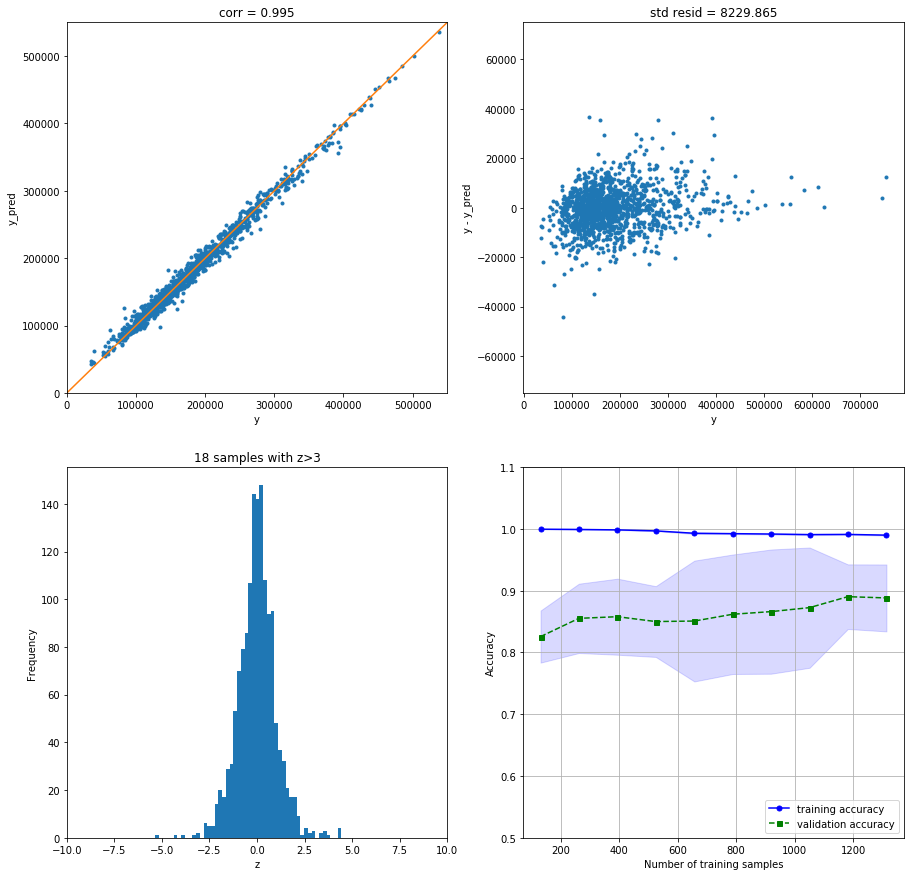

In [11]:
# interpret the model below using shap - first look at residuals for the whole model


# models being used

# 1 Ridge - to build the distribution
# 2 GB - error correction on the distribution with interactions of other terms
# 3 XGB - error correction on the first and second distribution with smaller interactions of the other terms

from sklearn.pipeline import make_pipeline
from sklearn.linear_model import RidgeCV,LassoCV
from xgboost import XGBRegressor
from tpot.builtins import StackingEstimator
from sklearn.ensemble import GradientBoostingRegressor,ExtraTreesRegressor

opt_models = dict()
score_models = pd.DataFrame(columns=['mean','std'])

exported_pipeline = make_pipeline(
    StackingEstimator(estimator=RidgeCV()), 
    StackingEstimator(estimator=
                      GradientBoostingRegressor(alpha=0.95, learning_rate=0.1, 
                      loss="lad", max_depth=3, max_features=0.2, min_samples_leaf=19,
                      min_samples_split=15, n_estimators=100, subsample=0.6500000000000001)),
    XGBRegressor(learning_rate=0.1, max_depth=5, min_child_weight=2, n_estimators=100, nthread=8, subsample=1.0)
)

score_models,model = fit_train(exported_pipeline,X_train,y_train,'Ridge_GB_XGB_2',score_models)


----------------------
RidgeCV(alphas=array([ 0.1,  1. , 10. ]), cv=None, fit_intercept=True,
    gcv_mode=None, normalize=False, scoring=None, store_cv_values=False)
----------------------
cross_val: mean= 0.14964705432455205 , std= 0.01584020135365058
20 outliers:
[178, 185, 377, 440, 473, 523, 581, 588, 632, 688, 691, 774, 803, 898, 1046, 1169, 1181, 1182, 1298, 1324]


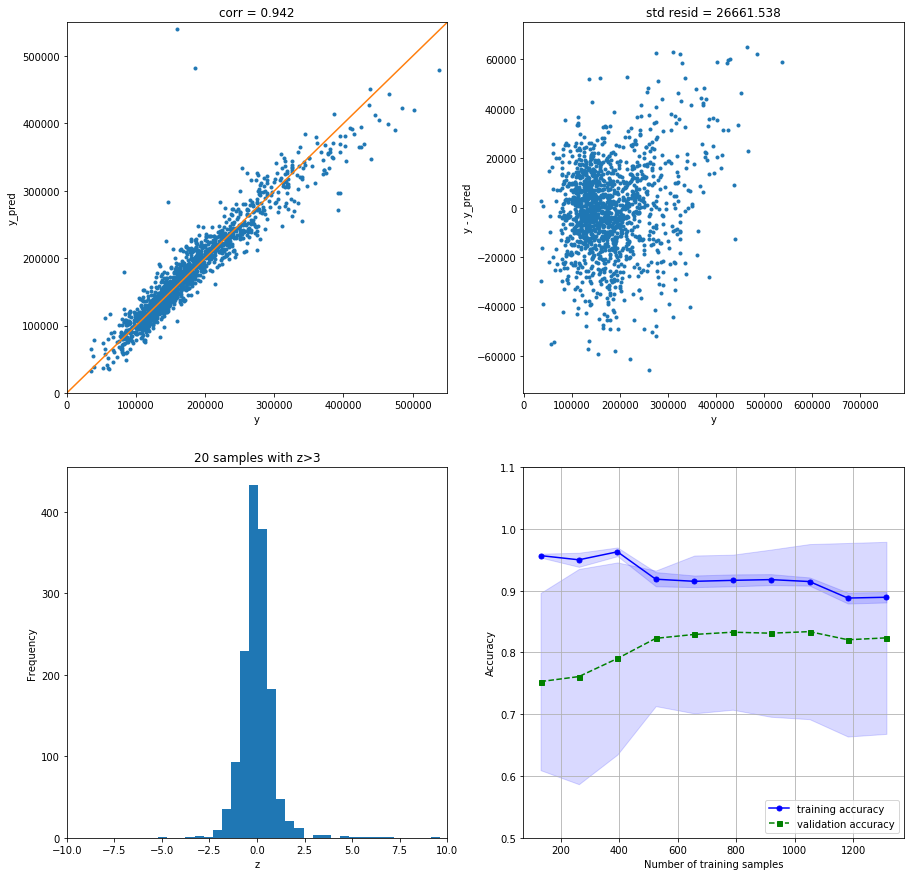

In [13]:
# first stacked layer - building the distribution using ridge

ridge = RidgeCV()
score_models,model = fit_train(ridge,X_train,y_train,'Ridge',score_models)


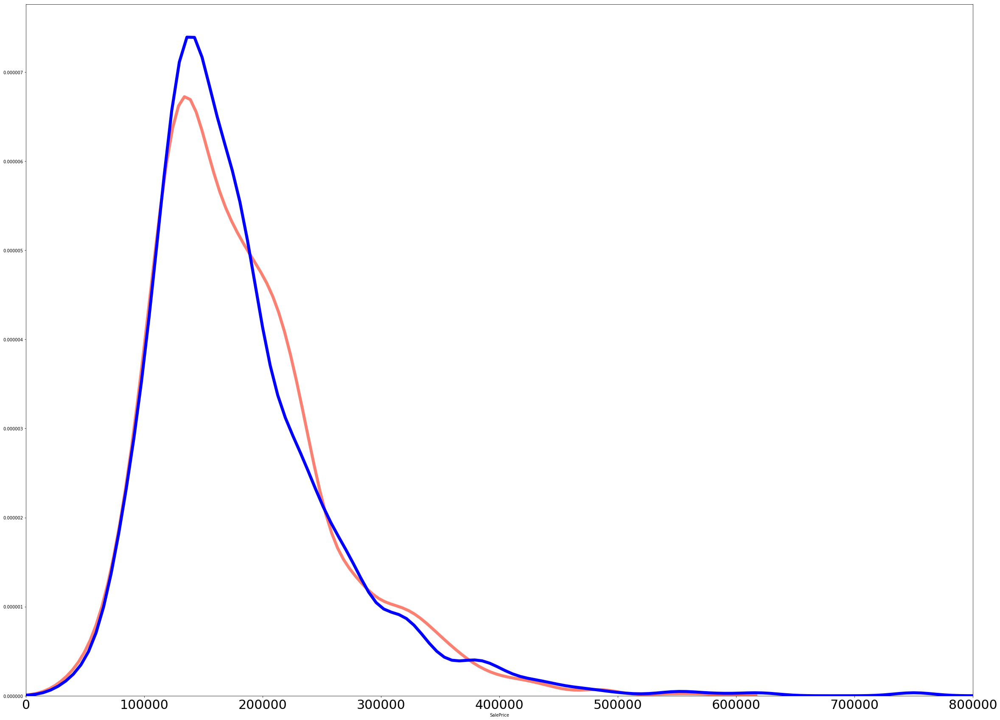

In [14]:
# blue distribution is the y_train
# salmon is the ridge prediction - almost identical distribution with a little more uneveness - not so normal
# look at the right side of the skewed distributions for the ridge prediction

ridge_pred = ridge.predict(X_train)
plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(ridge_pred,color="salmon",hist=False,kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False,kde_kws=dict( linewidth= 7))




In [31]:

# initiate shap for explanation of the model
# shap does a local explanation 
# trains model with all variables and then drops the variables to test the importances
# shap values is the output - responsibility of the variable vs the model
# does this over 1000s of samples on the same model to modulate the variance on explanation

import shap
explainer = shap.LinearExplainer(model,X_train)
shap_values_ridge = explainer.shap_values(X_train)

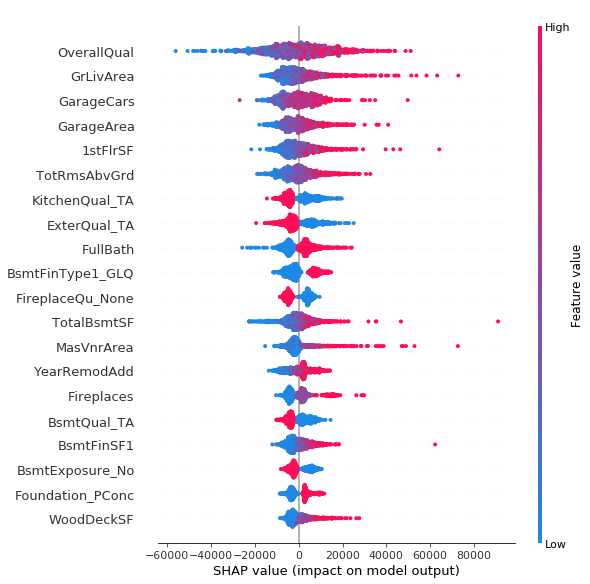

In [15]:
# the yellow distribution above has been built based on the values below
# red values signify high impact, blue value low impact relative to the area that it is predicting in

shap.initjs()
shap.summary_plot(shap_values_ridge,X_train)

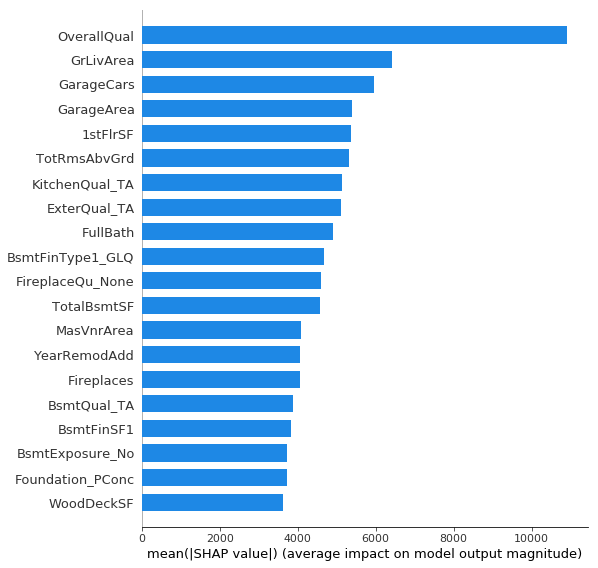

In [11]:
# ridge predictions importances ordered

shap.summary_plot(shap_values_ridge,X_train,plot_type="bar")

In [32]:
# let us look at a few individual predictions
# look at higher level prediction first - note the contributions - we predict these later on

shap.force_plot(explainer.expected_value,shap_values[1182],X_train.iloc[1182,:])

In [33]:
# look at lower level prediction next - note the contributions - we predict these later on

shap.force_plot(explainer.expected_value,shap_values[29],X_train.iloc[29,:])

In [34]:
# look at mid level prediction next - note the contributions - we predict these later on

shap.force_plot(explainer.expected_value,shap_values[961],X_train.iloc[961,:])

In [17]:
# take predicted vector and add in to the raw data for the 2nd prediction

ridge_pred = pd.DataFrame(ridge_pred)
X_train_comb = pd.concat([X_train,ridge_pred],axis=1)
X_train_comb.rename(columns = {0:'Ridge_prediction'},inplace=True)
X_train_comb.head(5)

,OverallQual,GarageCars,TotalBsmtSF,GrLivArea,GarageArea,FullBath,YearBuilt,GarageYrBlt,ExterQual_TA,1stFlrSF,...,SaleType_ConLD,3SsnPorch,LotShape_IR3,Condition1_PosN,BsmtFinType1_LwQ,BsmtFinType1_BLQ,MSZoning_RH,Neighborhood_NPkVill,FireplaceQu_Fa,Ridge_prediction
0,7,2.0,856.0,1710,548.0,2,2003,2003.0,0,856,...,0,0,0,0,0,0,0,0,0,205163.734202
1,6,2.0,1262.0,1262,460.0,2,1976,1976.0,1,1262,...,0,0,0,0,0,0,0,0,0,198310.061651
2,7,2.0,920.0,1786,608.0,2,2001,2001.0,0,920,...,0,0,0,0,0,0,0,0,0,209818.903542
3,7,3.0,756.0,1717,642.0,1,1915,1998.0,1,961,...,0,0,0,0,0,0,0,0,0,178945.772219
4,8,3.0,1145.0,2198,836.0,2,2000,2000.0,0,1145,...,0,0,0,0,0,0,0,0,0,299069.998349


----------------------
GradientBoostingRegressor(alpha=0.95, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='lad', max_depth=3, max_features=0.2,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=19,
             min_samples_split=15, min_weight_fraction_leaf=0.0,
             n_estimators=100, n_iter_no_change=None, presort='auto',
             random_state=None, subsample=0.6500000000000001, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False)
----------------------
cross_val: mean= 0.1255651866957209 , std= 0.01601773911439004
18 outliers:
[185, 313, 440, 523, 608, 632, 688, 691, 769, 774, 803, 898, 1046, 1169, 1181, 1182, 1298, 1324]


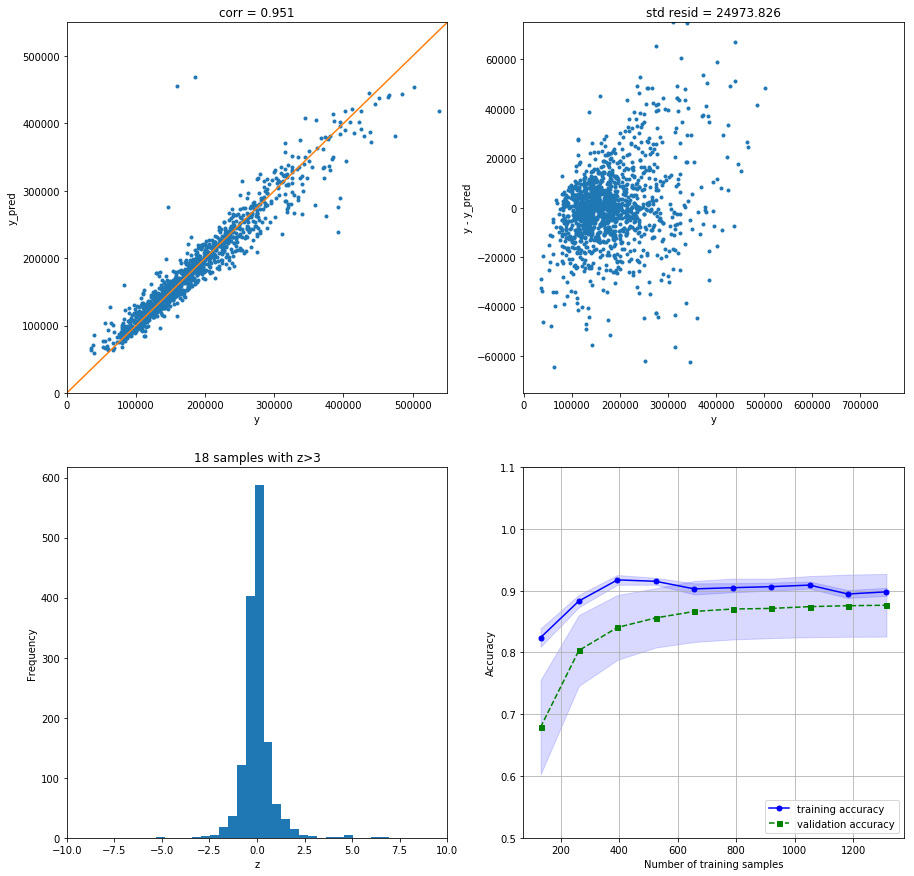

In [18]:
# initiate the 2nd layer, taking the ridge output + raw data
# as you see, it does some error correction on the distribution

gb = GradientBoostingRegressor(alpha=0.95, learning_rate=0.1, loss="lad", max_depth=3, max_features=0.2, min_samples_leaf=19, min_samples_split=15, n_estimators=100, subsample=0.6500000000000001)

score_models,model = fit_train(gb,X_train_comb,y_train,'gb + predictions',score_models)


In [19]:
# explain the gb + ridge model
def gb_predict(data_asarray):
    data_asframe =  pd.DataFrame(data_asarray, columns=X_train_comb.columns.tolist())
    return model.predict(data_asframe)

shap_kernel_explainer = shap.KernelExplainer(gb_predict, X_train_comb)
shap_values_gb = shap_kernel_explainer.shap_values(X_train_comb,nsamples=1000)

Using 1460 background data samples could cause slower run times. Consider using shap.kmeans(data, K) to summarize the background as K weighted samples.
100%|████████████████████████████████████| 1460/1460 [6:27:50<00:00, 16.53s/it]


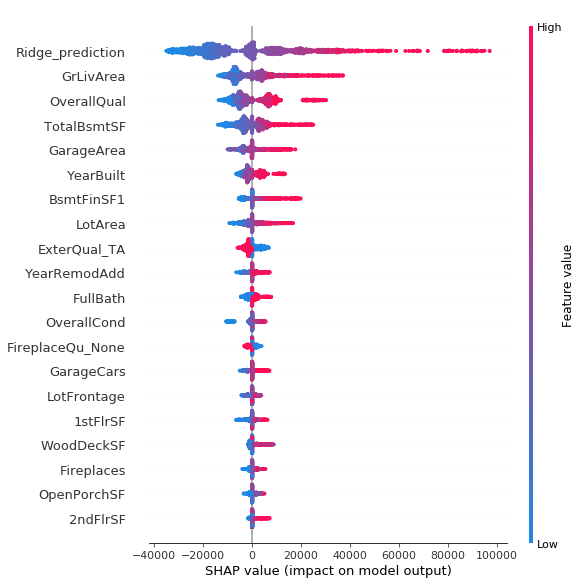

In [28]:
# highest important value is now the ridge prediction
# other terms still interact 
shap.summary_plot(shap_values_gb,X_train_comb)

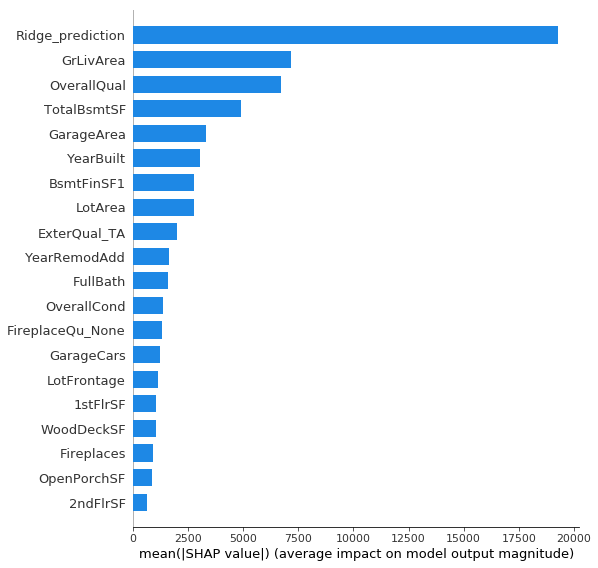

In [29]:
# bar plot on importances
shap.summary_plot(shap_values_gb,X_train_comb,plot_type="bar")

In [25]:
# look at the predictions in aggregate - see what is interacting with the ridge prediction

shap.force_plot(explainer.expected_value,shap_values_gb ,X_train_comb)

In [26]:
# look at the individual predictions to see how the variables are interacting
# as you can see, it is taking the variables that would predict a high house price + the ridge prediction

shap.force_plot(explainer.expected_value,shap_values_gb[1182],X_train_comb.iloc[1182,:])

In [27]:
# let us look at a lower end prediction and see how it is being compiled
# taking the base value and all the predictors that contribute to a negative price 

shap.force_plot(explainer.expected_value,shap_values_gb [29],X_train_comb.iloc[29,:])


In [22]:
y_train[1182]

745000

In [28]:
# look at one more prediction below in the middle of the pack

shap.force_plot(explainer.expected_value,shap_values_gb[961],X_train_comb.iloc[961,:])

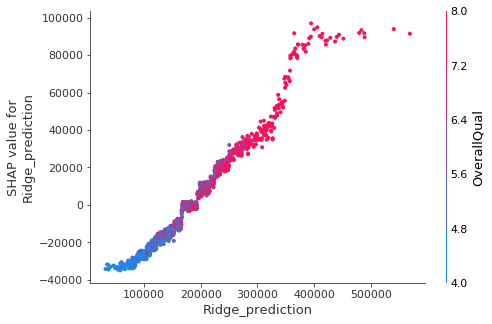

In [56]:
# look at dependence between the ridge prediction, the shap values and overall quality
# overall quality has higher impact on the upper ends of hte prediction - still some interactions  at the lower end

shap.dependence_plot('Ridge_prediction',shap_values=shap_values_gb,features=X_train_comb,interaction_index=0)

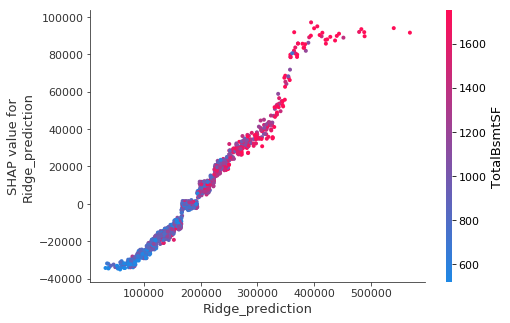

In [41]:
# Total Bsmt SF - interacts on lower end and scattered throughout - less interaction effect at higher end than overall quality

shap.dependence_plot('Ridge_prediction',shap_values=shap_values_gb,features=X_train_comb,interaction_index=2)

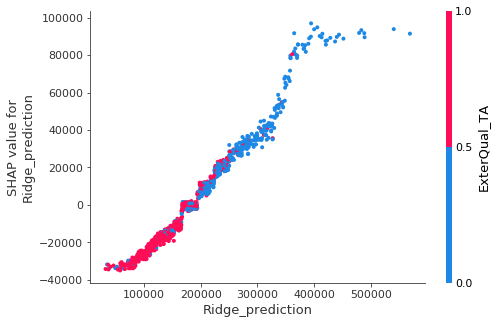

In [43]:
# Low Qual External quality
# bigger impact at lower end of predictions

shap.dependence_plot('Ridge_prediction',shap_values=shap_values_gb,features=X_train_comb,interaction_index=8)

In [44]:
# combine ridge prediction + gb correction term

gb_pred = model.predict(X_train_comb)
gb_pred = pd.DataFrame(gb_pred)
X_train_comb2 = pd.concat([X_train_comb,gb_pred],axis=1)
X_train_comb2.rename(columns = {0:'GB generalizer'},inplace=True)
X_train_comb2.head(5)

,OverallQual,GarageCars,TotalBsmtSF,GrLivArea,GarageArea,FullBath,YearBuilt,GarageYrBlt,ExterQual_TA,1stFlrSF,...,3SsnPorch,LotShape_IR3,Condition1_PosN,BsmtFinType1_LwQ,BsmtFinType1_BLQ,MSZoning_RH,Neighborhood_NPkVill,FireplaceQu_Fa,Ridge_prediction,GB generalizer
0,7,2.0,856.0,1710,548.0,2,2003,2003.0,0,856,...,0,0,0,0,0,0,0,0,205225.228639,209188.837435
1,6,2.0,1262.0,1262,460.0,2,1976,1976.0,1,1262,...,0,0,0,0,0,0,0,0,198180.084926,183997.851050
2,7,2.0,920.0,1786,608.0,2,2001,2001.0,0,920,...,0,0,0,0,0,0,0,0,209852.101200,216891.724300
3,7,3.0,756.0,1717,642.0,1,1915,1998.0,1,961,...,0,0,0,0,0,0,0,0,178961.368496,164196.424319
4,8,3.0,1145.0,2198,836.0,2,2000,2000.0,0,1145,...,0,0,0,0,0,0,0,0,299031.745513,294045.350024


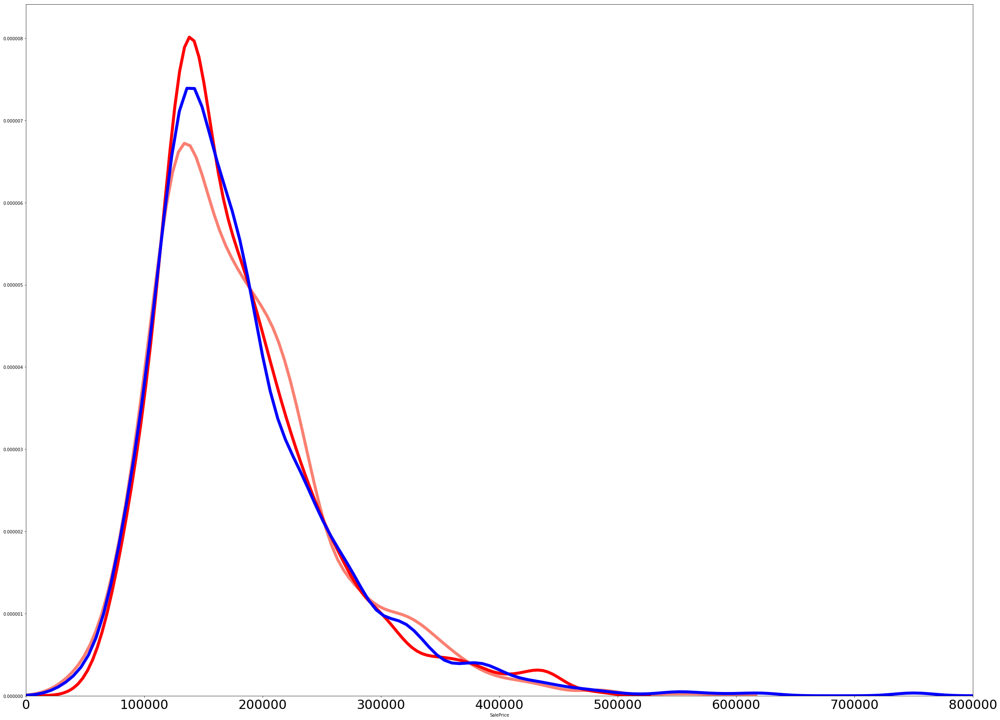

In [129]:
# plot out distributions
# blue distribution is the y_train
# salmon color is the ridge prediction - almost identical distribution with a little more uneveness - not so normal
# red distribution has corrected that uneveness - nature of the GB model
# look at the right side of the skewed distributions
# salmon pokes out but then GB corrects the distribution back in

plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(ridge_pred,color="salmon",hist=False,  kde_kws=dict( linewidth= 7))
sns.distplot(gb_pred,color="red",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))



----------------------
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=5, min_child_weight=2, missing=None, n_estimators=100,
       n_jobs=1, nthread=8, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1.0)
----------------------
cross_val: mean= 0.11142695290675234 , std= 0.014473085579264145
15 outliers:
[4, 13, 139, 377, 462, 559, 632, 681, 688, 707, 774, 970, 1075, 1324, 1453]


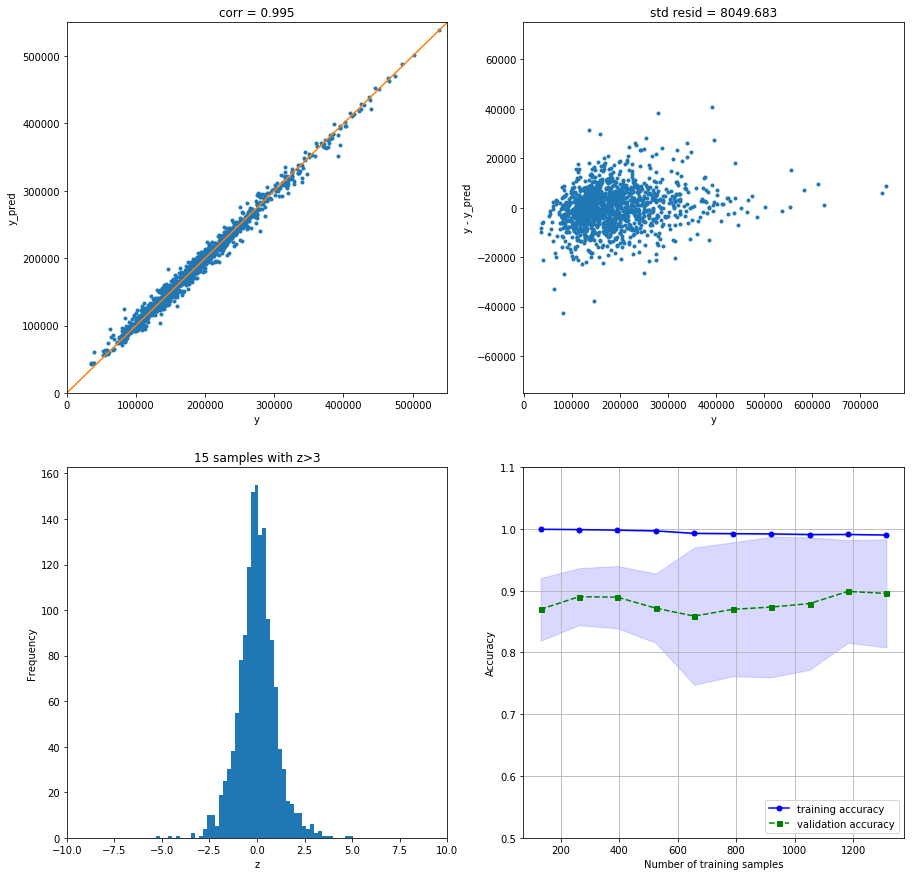

In [45]:
# run the XGB model with ridge and GB predictions
# best fitting model, residuals look tight

xgb = XGBRegressor(learning_rate=0.1, max_depth=5, min_child_weight=2, n_estimators=100, nthread=8, subsample=1.0)
score_models,model = fit_train(xgb,X_train_comb2,y_train,'xgb 2nd prediction',score_models)


In [ ]:
# too long to render the runs (2 pages long)

"""def xgb_predict(data_asarray):
    data_asframe =  pd.DataFrame(data_asarray, columns=X_train_comb2.columns.tolist())
    return model.predict(data_asframe)

shap_kernel_explainer = shap.KernelExplainer(xgb_predict, X_train_comb2)
shap_values_xgb = shap_kernel_explainer.shap_values(X_train_comb2,nsamples=1000)
"""

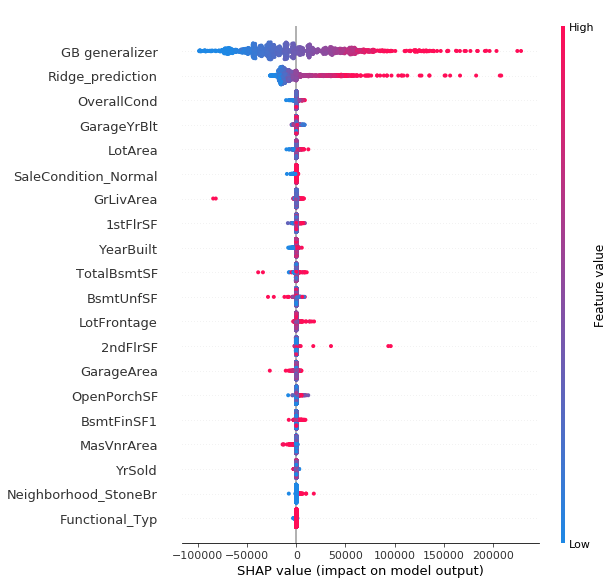

In [60]:
shap.summary_plot(shap_values_xgb ,X_train_comb2)

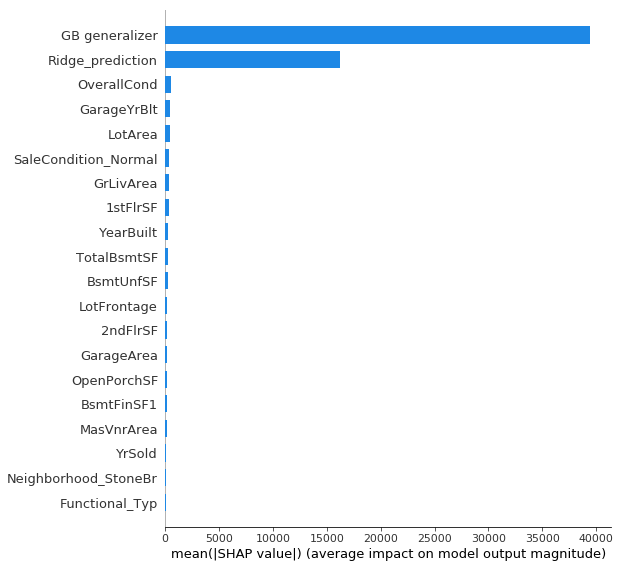

In [65]:
shap.summary_plot(shap_values_xgb ,X_train_comb2,plot_type="bar")

In [9]:
y_train[961]

272000

In [70]:
shap.force_plot(explainer.expected_value,shap_values_xgb [1182],X_train_comb2.iloc[1182,:])

In [71]:
shap.force_plot(explainer.expected_value,shap_values_xgb [29],X_train_comb2.iloc[29,:])

In [74]:
shap.force_plot(explainer.expected_value,shap_values_xgb [1298],X_train_comb2.iloc[1298,:])

In [75]:
shap.force_plot(explainer.expected_value,shap_values_xgb [961],X_train_comb2.iloc[961,:])

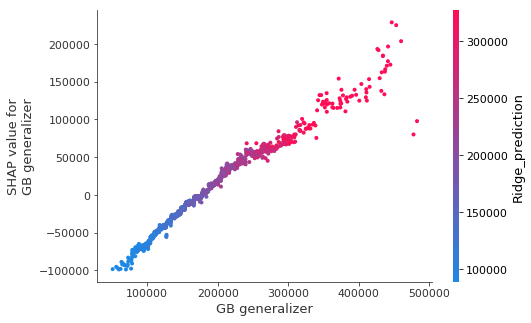

In [64]:
shap.dependence_plot('GB generalizer',shap_values=shap_values_xgb ,features=X_train_comb2,interaction_index=178)

In [96]:
xgb_pred = model.predict(X_train_comb2)
xgb_pred = pd.DataFrame(xgb_pred)
X_train_comb3 = pd.concat([X_train_comb2,xgb_pred],axis=1)
X_train_comb3.rename(columns = {0:'XGB generalizer'},inplace=True)
X_train_comb3.head(5)

,OverallQual,GarageCars,TotalBsmtSF,GrLivArea,GarageArea,FullBath,YearBuilt,GarageYrBlt,ExterQual_TA,1stFlrSF,...,LotShape_IR3,Condition1_PosN,BsmtFinType1_LwQ,BsmtFinType1_BLQ,MSZoning_RH,Neighborhood_NPkVill,FireplaceQu_Fa,Ridge_prediction,GB generalizer,XGB generalizer
0,7,2.0,856.0,1710,548.0,2,2003,2003.0,0,856,...,0,0,0,0,0,0,0,205225.228639,209188.837435,210003.921875
1,6,2.0,1262.0,1262,460.0,2,1976,1976.0,1,1262,...,0,0,0,0,0,0,0,198180.084926,183997.851050,183636.109375
2,7,2.0,920.0,1786,608.0,2,2001,2001.0,0,920,...,0,0,0,0,0,0,0,209852.101200,216891.724300,217406.859375
3,7,3.0,756.0,1717,642.0,1,1915,1998.0,1,961,...,0,0,0,0,0,0,0,178961.368496,164196.424319,145709.546875
4,8,3.0,1145.0,2198,836.0,2,2000,2000.0,0,1145,...,0,0,0,0,0,0,0,299031.745513,294045.350024,276390.812500


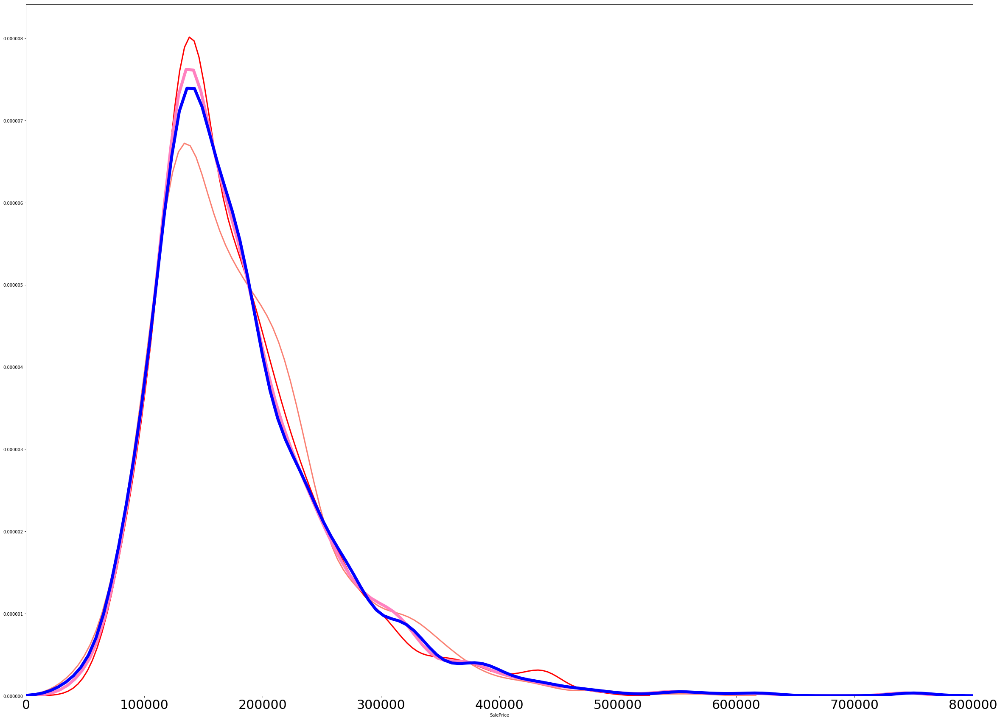

In [104]:
plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(ridge_pred,color="salmon",hist=False,  kde_kws=dict( linewidth= 3))
sns.distplot(gb_pred,color="red",hist=False, kde_kws=dict( linewidth= 3))
sns.distplot(xgb_pred,color="xkcd:pink",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))


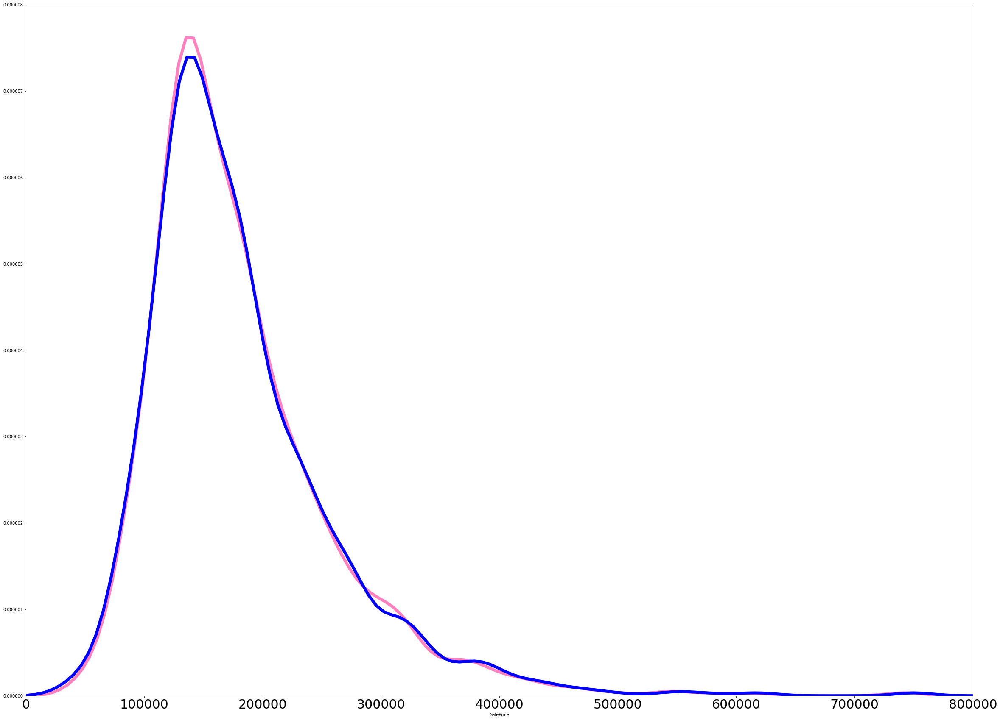

In [103]:
plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(xgb_pred,color="xkcd:pink",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))

In [126]:
# run the same predictions on test set and plot

ridge = RidgeCV()
ridge.fit(X_train,y_train)

X_test = X_test.reset_index(drop=True)

ridge_pred_test = ridge.predict(X_test)
ridge_pred_test = pd.DataFrame(ridge_pred_test)
X_test_comb = pd.concat([X_test,ridge_pred_test],axis=1)
X_test_comb.rename(columns={0:'Ridge_prediction'},inplace=True)
gb = GradientBoostingRegressor(alpha=0.95, learning_rate=0.1, loss="lad", max_depth=3, max_features=0.2, min_samples_leaf=19, min_samples_split=15, n_estimators=100, subsample=0.6500000000000001)
gb.fit(X_train_comb,y_train)

gb_pred_test = gb.predict(X_test_comb)
gb_pred_test = pd.DataFrame(gb_pred_test)
X_test_comb2 = pd.concat([X_test_comb,gb_pred_test],axis=1)
X_test_comb2.rename(columns = {0:'GB generalizer'},inplace=True)

xgb = XGBRegressor(learning_rate=0.1, max_depth=5, min_child_weight=2, n_estimators=100, nthread=8, subsample=1.0)
xgb.fit(X_train_comb2,y_train)

xgb_pred_test = xgb.predict(X_test_comb2)
xgb_pred_test = pd.DataFrame(xgb_pred_test)




,OverallQual,GarageCars,TotalBsmtSF,GrLivArea,GarageArea,FullBath,YearBuilt,GarageYrBlt,ExterQual_TA,1stFlrSF,...,LotShape_IR3,Condition1_PosN,BsmtFinType1_LwQ,BsmtFinType1_BLQ,MSZoning_RH,Neighborhood_NPkVill,FireplaceQu_Fa,Ridge_prediction,GB generalizer,XGB generalizer
0,5,1.0,882.0,896,730.0,1,1961,1961.0,1,896,...,0,0,0,0,1,0,0,106811.301051,126634.353332,123746.242188
1,6,1.0,1329.0,1329,312.0,1,1958,1958.0,1,1329,...,0,0,0,0,0,0,0,141355.114213,155757.815799,160400.078125
2,5,2.0,928.0,1629,482.0,2,1997,1997.0,1,928,...,0,0,0,0,0,0,0,181808.861371,187248.471216,197081.234375
3,6,2.0,926.0,1604,470.0,2,1998,1998.0,1,926,...,0,0,0,0,0,0,0,196139.310480,200319.867812,196413.265625
4,8,2.0,1280.0,1280,506.0,2,1992,1992.0,0,1280,...,0,0,0,0,0,0,0,209792.441278,203878.947975,200409.812500


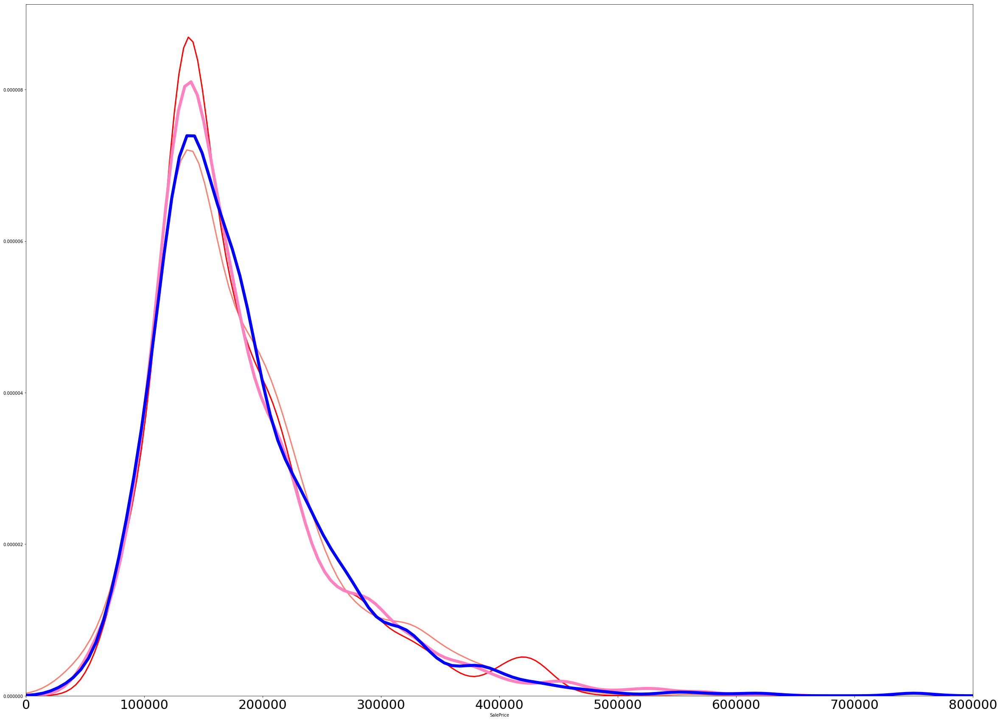

In [127]:
plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(ridge_pred_test,color="salmon",hist=False,  kde_kws=dict( linewidth= 3))
sns.distplot(gb_pred_test,color="red",hist=False, kde_kws=dict( linewidth= 3))
sns.distplot(xgb_pred_test,color="xkcd:pink",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))


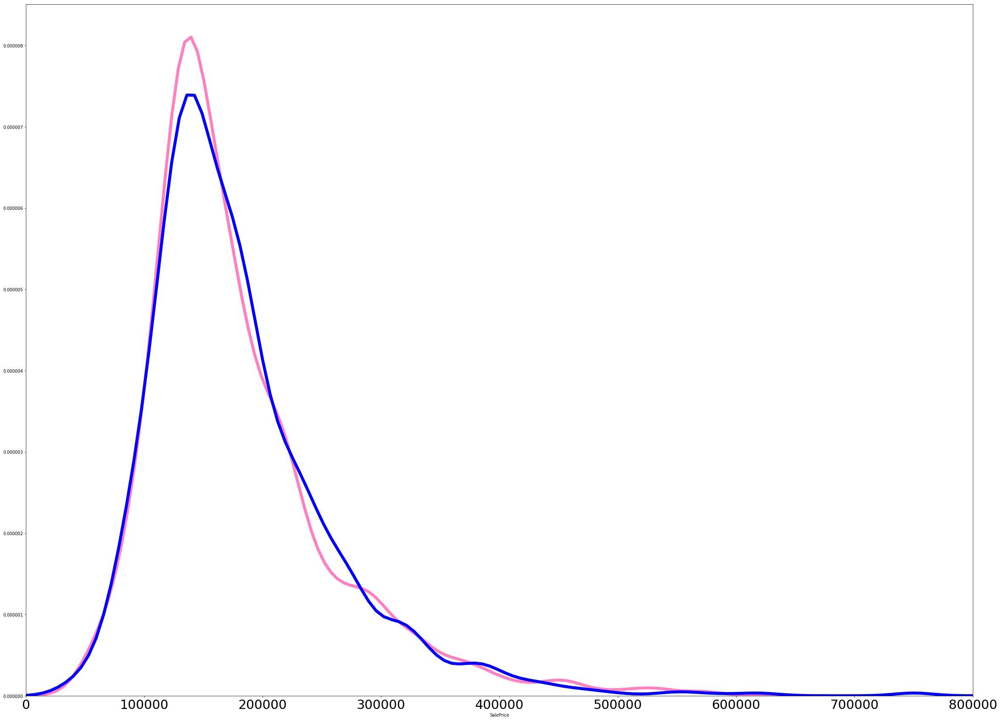

In [128]:
# let us look at the prediction based on the test data
# does pretty well to fit the distribution

plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(xgb_pred_test,color="xkcd:pink",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))

all_data size is : (2919, 80)
(1460, 115)
(1459, 115)
[MICE] Completing matrix with shape (1460, 52)
[MICE] Starting imputation round 1/110, elapsed time 0.001
[MICE] Starting imputation round 2/110, elapsed time 0.004
[MICE] Starting imputation round 3/110, elapsed time 0.007
[MICE] Starting imputation round 4/110, elapsed time 0.010
[MICE] Starting imputation round 5/110, elapsed time 0.012
[MICE] Starting imputation round 6/110, elapsed time 0.015
[MICE] Starting imputation round 7/110, elapsed time 0.017
[MICE] Starting imputation round 8/110, elapsed time 0.019
[MICE] Starting imputation round 9/110, elapsed time 0.022
[MICE] Starting imputation round 10/110, elapsed time 0.025
[MICE] Starting imputation round 11/110, elapsed time 0.027
[MICE] Starting imputation round 12/110, elapsed time 0.030
[MICE] Starting imputation round 13/110, elapsed time 0.034
[MICE] Starting imputation round 14/110, elapsed time 0.037
[MICE] Starting imputation round 15/110, elapsed time 0.040
[MICE] S

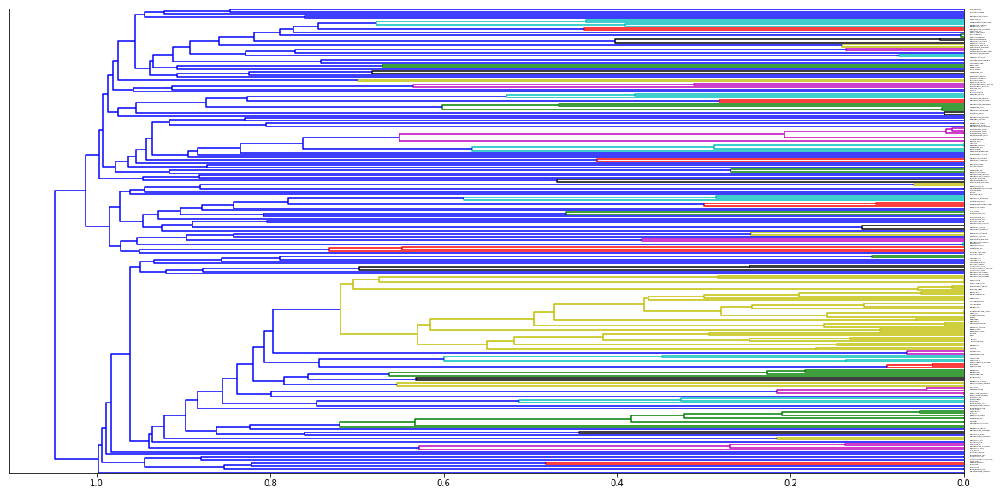

In [12]:
# review best model for feature engineering
# feature engineering and data download done below

from sklearn.model_selection import train_test_split,RepeatedKFold
from fancyimpute import MICE # imputation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve,cross_val_score,GridSearchCV
from sklearn.metrics import make_scorer
from jfunc import directory
import warnings

warnings.filterwarnings('ignore')
    
url = 'https://github.com/GinoWoz1/AdvancedHousePrices/raw/master/'
    
df_train = pd.read_csv(url + 'train.csv')
df_test = pd.read_csv(url +'test.csv')
df_train.columns.to_series().groupby(df_train.dtypes).groups

# Split data set into test and train
ntrain = df_train.shape[0]
ntest = df_test.shape[0]
y_train = df_train.SalePrice.values
all_data = pd.concat((df_train, df_test)).reset_index(drop=True)
all_data.drop(['SalePrice'], axis=1, inplace=True)
print("all_data size is : {}".format(all_data.shape))

# see missing data

all_data_na = (all_data.isnull().sum() / len(all_data)) * 100
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)[:30]
missing_data = pd.DataFrame({'Missing Ratio' :all_data_na})
missing_data.head(20)

# fill in missing data

all_data['PoolQC'] = all_data['PoolQC'].fillna("None")
all_data["MiscFeature"] = all_data["MiscFeature"].fillna("None")
all_data["Alley"] = all_data["Alley"].fillna("None")
all_data["Fence"] = all_data["Fence"].fillna("None")
all_data["FireplaceQu"] = all_data["FireplaceQu"].fillna("None")
all_data["TotalSF"] = all_data["GrLivArea"] + all_data["TotalBsmtSF"]

#fill in missing data for garage, basement and mason area

for col in ('GarageType', 'GarageFinish', 'GarageQual', 'GarageCond'):
    all_data[col] = all_data[col].fillna('None')

for col in ( 'GarageArea', 'GarageCars'):
    all_data[col] = all_data[col].fillna(0)
    
for col in ('BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2'):
    all_data[col] = all_data[col].fillna('None')
    
for col in ('BsmtHalfBath', 'BsmtFullBath', 'TotalBsmtSF', 'BsmtUnfSF', 'BsmtFinSF1','BsmtFinSF2'):
    all_data[col] = all_data[col].fillna(0)


all_data["MasVnrType"] = all_data["MasVnrType"].fillna("None")
all_data["MasVnrArea"] = all_data["MasVnrArea"].fillna(0)
all_data["GarageYrBlt"] = all_data.groupby("Neighborhood")["GarageYrBlt"].transform( lambda x: x.fillna(x.mean()))

# fill in MSzoning values based on knowlege of data
    
all_data.loc[2216,'MSZoning'] = 'RM'
all_data.loc[2904,'MSZoning'] = 'RM'
all_data.loc[1915,'MSZoning'] = 'RM'
all_data.loc[2250,'MSZoning'] = 'RM'
all_data.loc[1915,'Utilities'] = 'AllPub'
all_data.loc[1945,'Utilities'] = 'AllPub'
all_data.loc[2473,'Functional'] = 'Typ'
all_data.loc[2216,'Functional'] = 'Typ'
all_data.loc[2489,'SaleType'] = 'WD'
all_data.loc[2151,'Exterior1st'] = 'Plywood'
all_data.loc[2151,'Exterior2nd'] = 'Plywood'
all_data.loc[1379,'Electrical'] = 'SBrkr'
# analyze which neighborhoods have null data

all_data[pd.isna(all_data['LotFrontage'])].groupby("Neighborhood").size().sort_values(ascending = False)

# change from number to categorical variable (set in string)

all_data['MSSubClass'] = all_data['MSSubClass'].apply(str)

# feature engineering - create neighborhood, Subclass and quality groupings

all_data['HalfBathTransformed'] = all_data['HalfBath'] * 0.5
all_data['HalfBathBsmtTransformed'] = all_data['BsmtHalfBath'] * 0.5
all_data['Baths'] = all_data['FullBath'] + all_data['HalfBathTransformed'] + all_data['HalfBathBsmtTransformed']  + all_data['BsmtFullBath']


#Excellent, Good, Typical, Fair, Poor, None: Convert to 0-5 scale

cols_ExGd = ['ExterQual','ExterCond','BsmtQual','BsmtCond',
             'HeatingQC','KitchenQual','FireplaceQu','GarageQual',
            'GarageCond','PoolQC']

dict_ExGd = {'Ex':5,'Gd':4,'TA':3,'Fa':2,'Po':1,'None':0}

for col in cols_ExGd:
    all_data[col].replace(dict_ExGd, inplace=True)

all_data.loc[1555,'KitchenQual'] = 3

# create new neighborhood groups

def neigh(row):
    if row['Neighborhood'] == 'Blmngtn':
        return 'BNS'
    elif row['Neighborhood'] =='Gilbert':
        return 'BNS'
    elif row['Neighborhood'] =='NWAmes':
        return 'BNS' 
    elif row['Neighborhood'] =='SawyerW':
        return 'BNS'
    elif row['Neighborhood']=='Blueste':
        return 'BlueSwis'
    elif row['Neighborhood']=='Mitchel':
        return 'BlueSwis' 
    elif row['Neighborhood'] =='NAmes':
        return 'BlueSwis' 
    elif row['Neighborhood'] =='NPkVill':
        return 'BlueSwis' 
    elif row['Neighborhood'] =='Sawyer':
        return 'BlueSwis' 
    elif row['Neighborhood']=='SWISU':
        return 'BlueSwis'
    elif row['Neighborhood']=='BrDale':
        return 'BrMeadow' 
    elif row['Neighborhood'] =='IDOTRR':
        return 'BrMeadow' 
    elif row['Neighborhood'] =='MeadowV':
        return 'BrMeadow' 
    elif row['Neighborhood'] =='BrkSide':
        return 'BEO' 
    elif row['Neighborhood']=='Edwards':
        return 'BEO'
    elif row['Neighborhood']=='OldTown':
        return 'BEO'
    elif row['Neighborhood'] =='NoRidge':
        return 'NNS' 
    elif row['Neighborhood'] =='NridgHt':
        return 'NNS' 
    elif row['Neighborhood'] =='StoneBr':
        return 'NNS' 
    elif row['Neighborhood']=='Somerst':
        return 'STV'
    elif row['Neighborhood']=='Timber':
        return 'STV' 
    elif row['Neighborhood']=='Veenker':
        return 'STV'
    elif row['Neighborhood']=='CollgCr':
        return 'C3'
    elif row['Neighborhood']=='Crawfor':
        return 'C3' 
    elif row['Neighborhood']=='ClearCr':
        return 'C3'
    else:
        return row['Neighborhood']
 
def bldg_type(row):
    if row['BldgType'] == '1Fam':
        return '1Fam'
    else:
        return 'BldgGroup'

def sub_class(row):
    if row['MSSubClass'] == '60':
        return '60'
    elif row['MSSubClass']=='120':
        return '120'
    elif row['MSSubClass']=='160':
        return 'Group1'
    elif row['MSSubClass']=='190':
        return 'Group1'
    elif row['MSSubClass']=='40':
        return 'Group1'
    elif row['MSSubClass']=='50':
        return 'Group1'
    elif row['MSSubClass']=='70':
        return 'Group1'
    elif row['MSSubClass']=='85':
        return 'Group1'
    elif row['MSSubClass']=='90':
        return 'Group1'
    elif row['MSSubClass']=='180':
        return 'Group2'
    elif row['MSSubClass']=='30':
        return 'Group2'
    elif row['MSSubClass']=='45':
        return 'Group2'
    elif row['MSSubClass']=='20':
        return 'Group3'
    elif row['MSSubClass']=='75':
        return 'Group3'
    elif row['MSSubClass']=='80':
        return 'Group3'                
    else:
        return row['MSSubClass']
    
def foundation(row):
    if row['Foundation'] == 'BrkTil':
        return 'Group1'
    elif row['Foundation']=='CBlock':
        return 'Group1'
    elif row['Foundation']=='Stone':
        return 'Group1'
    elif row['Foundation']=='Wood':
        return 'Group1'
    elif row['Foundation']=='PConc':
        return 'PConc'
    elif row['Foundation']=='Slab':
        return 'Slab'
    else:
        return row['Foundation']

def sale_type(row):
    if row['SaleType'] == 'COD':
        return 'Group1'
    elif row['SaleType']=='ConLD':
        return 'Group1'
    elif row['SaleType']=='ConLw':
        return 'Group1'
    elif row['SaleType']=='Oth':
        return 'Group1'
    elif row['SaleType']=='WD':
        return 'Group1'
    elif row['SaleType']=='Con':
        return 'Group2'
    elif row['SaleType']=='ConLI':
        return 'Group2'
    elif row['SaleType']=='CWD':
        return 'Group2'
    elif row['SaleType']=='New':
        return 'Group2'  
    else:
        return row['SaleType']
    
def exterior_1st(row):
    if row['Exterior1st'] == 'AsbShng':
        return 'Group1'
    elif row['Exterior1st']=='AsphShn':
        return 'Group1'
    elif row['Exterior1st']=='BrkComm':
        return 'Group1'
    elif row['Exterior1st']=='CBlock':
        return 'Group1'
    elif row['Exterior1st']=='BrkFace':
        return 'Group2'
    elif row['Exterior1st']=='CemntBd':
        return 'Group2'
    elif row['Exterior1st']=='ImStucc':
        return 'Group2'
    elif row['Exterior1st']=='Stone':
        return 'Group2'
    elif row['Exterior1st']=='VinylSd':
        return 'Group2'  
    elif row['Exterior1st']=='HdBoard':
        return 'Group3'
    elif row['Exterior1st']=='MetalSd':
        return 'Group4'
    elif row['Exterior1st']=='Stucco':
        return 'Group4'
    elif row['Exterior1st']=='Wd Sdng':
        return 'Group4'
    elif row['Exterior1st']=='WdShing':
        return 'Group4'
    elif row['Exterior1st']=='Plywood':
        return 'Group5'  
    else:
        return row['Exterior1st']
    
def masvnr_type(row):
    if row['MasVnrType'] == 'BrkCmn':
        return 'Group1'
    elif row['MasVnrType']=='None':
        return 'Group1'
    elif row['MasVnrType']=='BrkFace':
        return 'Group2'
    elif row['MasVnrType']=='NA':
        return 'Group3'
    elif row['MasVnrType']=='Stone':
        return 'Group3'
    else:
        return row['MasVnrType']
    
def roof_style(row):
    if row['RoofStyle'] == 'Flat':
        return 'Group1'
    elif row['RoofStyle']=='Hip':
        return 'Group1'
    elif row['RoofStyle']=='Mansard':
        return 'Group1'
    elif row['RoofStyle']=='Shed':
        return 'Group1'
    elif row['RoofStyle']=='Gable':
        return 'Group2'
    elif row['RoofStyle']=='Gambrel':
        return 'Group2'
    else:
        return row['RoofStyle']
    
def mszoning(row):
    if row['MSZoning'] == 'C (all)':
        return 'Group1'
    elif row['MSZoning']=='RH':
        return 'Group1'
    elif row['MSZoning']=='RM':
        return 'Group1'
    elif row['MSZoning']=='FV':
        return 'Group2'
    elif row['MSZoning']=='RL':
        return 'Group2'
    else:
        return row['MSZoning']

def land_contour(row):
    if row['LandContour'] == 'Bnk':
        return 'Group1'
    elif row['LandContour']=='HLS':
        return 'Group2'
    elif row['LandContour']=='Low':
        return 'Group2'
    elif row['LandContour']=='Lvl':
        return 'Group3'
    else:
        return row['LandContour']
             
def exposure(row):
    if row['BsmtExposure'] == 'Av':
        return 'Group1'
    elif row['BsmtExposure']=='Mn':
        return 'Group1'
    elif row['BsmtExposure']=='Gd':
        return 'Group2'
    elif row['BsmtExposure']=='NA':
        return 'Group3'
    elif row['BsmtExposure']=='No':
        return 'Group4'
    else:
        return row['BsmtExposure']

def electrical(row):
    if row['Electrical'] == 'FuseA':
        return 'Group1'
    elif row['Electrical']=='FuseF':
        return 'Group1'
    elif row['Electrical']=='FuseP':
        return 'Group1'
    elif row['Electrical']=='Mix':
        return 'Group1'
    elif row['Electrical']=='NA':
        return 'Group1'
    elif row['Electrical']=='SBrkr':
        return 'Group2'
    else:
        return row['Electrical']

def lot_shape(row):
    if row['LotShape'] == 'IR1':
        return 'Group1'
    elif row['LotShape']=='IR2':
        return 'Group2'
    elif row['LotShape']=='IR3':
        return 'Group2'
    elif row['LotShape']=='Reg':
        return 'Group3'
    else:
        return row['LotShape']   

def sale_condition(row):
    if row['SaleCondition'] == 'Abnorml':
        return 'Group1'
    elif row['SaleCondition']=='AdjLand':
        return 'Group1'
    elif row['SaleCondition']=='Alloca':
        return 'Group1'
    elif row['SaleCondition']=='Family':
        return 'Group1'
    elif row['SaleCondition']=='Normal':
        return 'Group2'
    elif row['SaleCondition']=='Partial':
        return 'Group2'
    else:
        return row['SaleCondition']   
    
    
all_data['SaleTypeGroup'] = all_data.apply(sale_type,axis=1)
all_data['FoundationGroup'] = all_data.apply(foundation,axis=1) 
all_data['MSSubClassGroup'] = all_data.apply(sub_class,axis=1) 
all_data['BldgGroup'] = all_data.apply(bldg_type,axis=1)
all_data['NeighGroup'] = all_data.apply(neigh,axis=1)  
all_data['Ext1stGrp'] = all_data.apply(exterior_1st,axis=1)
all_data['MasVnrGroup'] = all_data.apply(masvnr_type,axis=1)
all_data['RoofstyleGroup'] = all_data.apply(roof_style,axis=1)
all_data['MSZoningGroup'] = all_data.apply(mszoning,axis=1)
all_data['LandContourGroup'] = all_data.apply(land_contour,axis=1)
all_data['ExposureGroup'] = all_data.apply(exposure,axis=1)
all_data['ElectricalGroup'] = all_data.apply(electrical,axis=1)
all_data['LotShapeGroup'] = all_data.apply(lot_shape,axis=1)
all_data['SaleConditionGroup'] = all_data.apply(sale_condition,axis=1)

# create column for year built after a certain date

all_data['After91'] = np.where(all_data['YearBuilt'] > 1991,1,0)  
all_data['YearBuiltRev'] = all_data['YearBuilt'] - 1875

# Exter and KitchenQual Combined

all_data['KitchenExterQual'] = all_data['KitchenQual'] + all_data['ExterQual']

dummy_cols = ['2ndFlrSF',
              'MiscVal','ScreenPorch','WoodDeckSF','OpenPorchSF',
              'EnclosedPorch','MasVnrArea','GarageArea','Fireplaces','TotalBsmtSF']

for col in dummy_cols:
    all_data['Has'+col] = (all_data[col]>0).astype(int)
    
# column for MasVnrStone    
all_data['HasVnrStone'] = np.where(all_data['MasVnrType'] == 'Stone',1,0)

#columns for HeatingQC
all_data['HeatingEx'] = np.where(all_data['HeatingQC'] == 5,1,0)

# duplex
all_data['IsDuplex'] = np.where(all_data['BldgType'] == "Duplex",1,0)

# foundation is concrete
all_data['HasPconc'] = np.where(all_data['Foundation'] == "PConc",1,0)

# evaluation metrics and model vetting function


train = all_data[:ntrain]
test = all_data[ntrain:]
y_train = df_train.SalePrice
print(train.shape)
print(test.shape)
# imputation
numeric_data_train = train.select_dtypes(include = ['float64','int64'])
solver=MICE()
Imputed_dataframe_train= pd.DataFrame(data = solver.complete(numeric_data_train),columns = numeric_data_train.columns,index = numeric_data_train.index)
numeric_data_test = test.select_dtypes(include = ['float64','int64'])
solver=MICE()
Imputed_dataframe_test= pd.DataFrame(data = solver.complete(numeric_data_test),columns = numeric_data_test.columns,index = numeric_data_test.index)

train['LotFrontage'] = Imputed_dataframe_train['LotFrontage']
test['LotFrontage'] = Imputed_dataframe_test['LotFrontage']

X_train= pd.get_dummies(train,drop_first=True)
X_test = pd.get_dummies(test,drop_first=True)
X_test.loc[2120,'TotalSF'] = 896

from sklearn.feature_selection import  mutual_info_regression # mutual information

X_train = X_train[['TotalSF',	'OverallQual',	'KitchenExterQual',	'GrLivArea',	'TotalBsmtSF',	'GarageArea',	'GarageCars',	'Baths',	'ExterQual',	'KitchenQual',	'BsmtQual',	'GarageYrBlt',	'FullBath',	'YearBuiltRev',	'YearBuilt',	'1stFlrSF',	'After91',	'LotFrontage',	'YearRemodAdd',	'FireplaceQu',	'HasPconc',	'HasFireplaces',	'FoundationGroup_PConc',	'TotRmsAbvGrd',	'Fireplaces',	'HeatingQC',	'Foundation_PConc',	'NeighGroup_NNS',	'BsmtFinSF1',	'GarageFinish_Unf',	'HasOpenPorchSF',	'HeatingEx',	'NeighGroup_BlueSwis',	'MSSubClassGroup_60',	'BsmtUnfSF',	'GarageType_Attchd',	'MSSubClass_60',	'OverallCond',	'2ndFlrSF',	'Foundation_CBlock',	'MSZoningGroup_Group2',	'GarageType_Detchd',	'BsmtFinType1_GLQ',	'Exterior2nd_VinylSd',	'Ext1stGrp_Group2',	'HalfBathTransformed',	'HalfBath',	'MasVnrArea',	'LotArea',	'SaleType_New',	'SaleCondition_Partial',	'LotShape_Reg',	'LotShapeGroup_Group3',	'MSSubClassGroup_Group2',	'GarageFinish_RFn',	'SaleTypeGroup_Group2',	'BedroomAbvGr',	'Ext1stGrp_Group4',	'NeighGroup_BNS',	'MSZoning_RM',	'Neighborhood_NAmes',	'HasWoodDeckSF',	'Exterior1st_VinylSd',	'NeighGroup_STV',	'MasVnrType_None',	'MasVnrType_Stone',	'NeighGroup_C3',	'OpenPorchSF',	'GarageFinish_None',	'HasVnrStone',	'Neighborhood_NridgHt',	'HasMasVnrArea',	'Electrical_SBrkr',	'MSSubClass_30',	'Neighborhood_Somerst',	'MasVnrGroup_Group3',	'GarageCond',	'Neighborhood_NoRidge',	'Exterior2nd_Wd Sdng',	'MSZoning_RL',	'WoodDeckSF',	'SaleType_WD',	'GarageType_None',	'NeighGroup_BrMeadow',	'HasGarageArea',	'MasVnrGroup_Group2',	'BsmtCond',	'Neighborhood_OldTown',	'MSSubClassGroup_Group1',	'Neighborhood_CollgCr',	'Neighborhood_Gilbert',	'BsmtExposure_Gd',	'MasVnrType_BrkFace',	'Fence_None',	'GarageQual',	'CentralAir_Y',	'Exterior1st_Wd Sdng',	'HouseStyle_2Story',	'BldgType_Duplex',	'HasEnclosedPorch',	'Neighborhood_IDOTRR',	'BsmtFinType2_None',	'IsDuplex',	'MSZoning_FV',	'ElectricalGroup_Group2',	'BsmtFullBath',	'EnclosedPorch',	'PavedDrive_Y',	'HasScreenPorch',	'ExposureGroup_Group2',	'Neighborhood_BrkSide',	'BsmtFinType1_None',	'LotConfig_CulDSac',	'HasTotalBsmtSF',	'ExposureGroup_Group4',	'Neighborhood_NPkVill',	'Alley_None',	'Fence_MnPrv',	'ExposureGroup_None',	'RoofstyleGroup_Group2',	'GarageType_BuiltIn',	'MSSubClass_50',	'Electrical_FuseF',	'Has2ndFlrSF',	'BldgGroup_BldgGroup',	'BsmtExposure_None',	'Neighborhood_BrDale',	'Exterior2nd_MetalSd',	'BsmtExposure_No',	'MSSubClass_160',	'Ext1stGrp_Group3',	'Neighborhood_Edwards',	'Exterior1st_MetalSd',	'SaleCondition_Normal',	'HouseStyle_SLvl',	'Neighborhood_Sawyer',	'SaleType_ConLD',	'MSSubClass_80',	'Foundation_Wood',	'BsmtFinType1_Rec',	'LandContourGroup_Group2',	'ScreenPorch',	'Ext1stGrp_Group5',	'YrSold',	'Neighborhood_StoneBr',	'Exterior2nd_Plywood',	'GarageType_CarPort',	'MSSubClass_90',	'BsmtHalfBath',	'LandContourGroup_Group3',	'Exterior2nd_CmentBd',	'MSSubClassGroup_Group3',	'Neighborhood_Crawfor',	'Neighborhood_NWAmes',	'LotConfig_Inside',	'Functional_Typ',	'Neighborhood_SawyerW',	'Exterior2nd_HdBoard',	'Foundation_Slab',	'BldgType_Twnhs',	'KitchenAbvGr',	'MSSubClass_180',	'ExterCond',	'LandContour_Low',	'HouseStyle_SFoyer',	'HouseStyle_1Story',	'Exterior1st_HdBoard',	'FoundationGroup_Slab',	'MSSubClass_85',	'Neighborhood_Mitchel',	'Exterior2nd_Stucco',	'PoolQC',	'HouseStyle_1.5Unf',	'MSSubClass_20',	'Alley_Pave',	'RoofStyle_Shed',	'BsmtFinType1_BLQ',	'SaleCondition_Alloca',	'Exterior2nd_Wd Shng',	'BsmtExposure_Mn',	'Electrical_FuseP',	'Heating_Wall',	'MSSubClass_45',	'Neighborhood_Blueste',	'Neighborhood_Timber',	'Functional_Min2',	'HasMiscVal',	'RoofStyle_Hip',	'HalfBathBsmtTransformed',	'RoofStyle_Gable',	'BldgType_2fmCon',	'Exterior2nd_Brk Cmn',	'LandContour_HLS',	'LotShape_IR3',	'LotShape_IR2',	'Exterior1st_AsphShn',	'Exterior2nd_AsphShn',	'PavedDrive_P',	'RoofMatl_WdShake',	'LotShapeGroup_Group2',	'RoofMatl_WdShngl',	'Street_Pave',	'Condition1_RRAe',	'Condition2_Feedr',	'SaleType_CWD',	'SaleConditionGroup_Group2',	'Functional_Mod',	'BsmtFinType2_BLQ',	'RoofMatl_Tar&Grv',	'LandContour_Lvl',	'MSZoning_RH',	'HouseStyle_2.5Unf',	'Neighborhood_Veenker',	'MSSubClass_70',	'Exterior1st_CemntBd',	'Condition1_PosA',	'Condition1_PosN',	'Neighborhood_SWISU',	'Condition2_Norm',	'BsmtFinSF2',	'Exterior1st_WdShing',	'Neighborhood_MeadowV',	'MSSubClass_40',	'Condition2_PosA',	'BsmtFinType2_Rec',	'LowQualFinSF',	'RoofStyle_Gambrel']]
X_test = X_test[['TotalSF',	'OverallQual',	'KitchenExterQual',	'GrLivArea',	'TotalBsmtSF',	'GarageArea',	'GarageCars',	'Baths',	'ExterQual',	'KitchenQual',	'BsmtQual',	'GarageYrBlt',	'FullBath',	'YearBuiltRev',	'YearBuilt',	'1stFlrSF',	'After91',	'LotFrontage',	'YearRemodAdd',	'FireplaceQu',	'HasPconc',	'HasFireplaces',	'FoundationGroup_PConc',	'TotRmsAbvGrd',	'Fireplaces',	'HeatingQC',	'Foundation_PConc',	'NeighGroup_NNS',	'BsmtFinSF1',	'GarageFinish_Unf',	'HasOpenPorchSF',	'HeatingEx',	'NeighGroup_BlueSwis',	'MSSubClassGroup_60',	'BsmtUnfSF',	'GarageType_Attchd',	'MSSubClass_60',	'OverallCond',	'2ndFlrSF',	'Foundation_CBlock',	'MSZoningGroup_Group2',	'GarageType_Detchd',	'BsmtFinType1_GLQ',	'Exterior2nd_VinylSd',	'Ext1stGrp_Group2',	'HalfBathTransformed',	'HalfBath',	'MasVnrArea',	'LotArea',	'SaleType_New',	'SaleCondition_Partial',	'LotShape_Reg',	'LotShapeGroup_Group3',	'MSSubClassGroup_Group2',	'GarageFinish_RFn',	'SaleTypeGroup_Group2',	'BedroomAbvGr',	'Ext1stGrp_Group4',	'NeighGroup_BNS',	'MSZoning_RM',	'Neighborhood_NAmes',	'HasWoodDeckSF',	'Exterior1st_VinylSd',	'NeighGroup_STV',	'MasVnrType_None',	'MasVnrType_Stone',	'NeighGroup_C3',	'OpenPorchSF',	'GarageFinish_None',	'HasVnrStone',	'Neighborhood_NridgHt',	'HasMasVnrArea',	'Electrical_SBrkr',	'MSSubClass_30',	'Neighborhood_Somerst',	'MasVnrGroup_Group3',	'GarageCond',	'Neighborhood_NoRidge',	'Exterior2nd_Wd Sdng',	'MSZoning_RL',	'WoodDeckSF',	'SaleType_WD',	'GarageType_None',	'NeighGroup_BrMeadow',	'HasGarageArea',	'MasVnrGroup_Group2',	'BsmtCond',	'Neighborhood_OldTown',	'MSSubClassGroup_Group1',	'Neighborhood_CollgCr',	'Neighborhood_Gilbert',	'BsmtExposure_Gd',	'MasVnrType_BrkFace',	'Fence_None',	'GarageQual',	'CentralAir_Y',	'Exterior1st_Wd Sdng',	'HouseStyle_2Story',	'BldgType_Duplex',	'HasEnclosedPorch',	'Neighborhood_IDOTRR',	'BsmtFinType2_None',	'IsDuplex',	'MSZoning_FV',	'ElectricalGroup_Group2',	'BsmtFullBath',	'EnclosedPorch',	'PavedDrive_Y',	'HasScreenPorch',	'ExposureGroup_Group2',	'Neighborhood_BrkSide',	'BsmtFinType1_None',	'LotConfig_CulDSac',	'HasTotalBsmtSF',	'ExposureGroup_Group4',	'Neighborhood_NPkVill',	'Alley_None',	'Fence_MnPrv',	'ExposureGroup_None',	'RoofstyleGroup_Group2',	'GarageType_BuiltIn',	'MSSubClass_50',	'Electrical_FuseF',	'Has2ndFlrSF',	'BldgGroup_BldgGroup',	'BsmtExposure_None',	'Neighborhood_BrDale',	'Exterior2nd_MetalSd',	'BsmtExposure_No',	'MSSubClass_160',	'Ext1stGrp_Group3',	'Neighborhood_Edwards',	'Exterior1st_MetalSd',	'SaleCondition_Normal',	'HouseStyle_SLvl',	'Neighborhood_Sawyer',	'SaleType_ConLD',	'MSSubClass_80',	'Foundation_Wood',	'BsmtFinType1_Rec',	'LandContourGroup_Group2',	'ScreenPorch',	'Ext1stGrp_Group5',	'YrSold',	'Neighborhood_StoneBr',	'Exterior2nd_Plywood',	'GarageType_CarPort',	'MSSubClass_90',	'BsmtHalfBath',	'LandContourGroup_Group3',	'Exterior2nd_CmentBd',	'MSSubClassGroup_Group3',	'Neighborhood_Crawfor',	'Neighborhood_NWAmes',	'LotConfig_Inside',	'Functional_Typ',	'Neighborhood_SawyerW',	'Exterior2nd_HdBoard',	'Foundation_Slab',	'BldgType_Twnhs',	'KitchenAbvGr',	'MSSubClass_180',	'ExterCond',	'LandContour_Low',	'HouseStyle_SFoyer',	'HouseStyle_1Story',	'Exterior1st_HdBoard',	'FoundationGroup_Slab',	'MSSubClass_85',	'Neighborhood_Mitchel',	'Exterior2nd_Stucco',	'PoolQC',	'HouseStyle_1.5Unf',	'MSSubClass_20',	'Alley_Pave',	'RoofStyle_Shed',	'BsmtFinType1_BLQ',	'SaleCondition_Alloca',	'Exterior2nd_Wd Shng',	'BsmtExposure_Mn',	'Electrical_FuseP',	'Heating_Wall',	'MSSubClass_45',	'Neighborhood_Blueste',	'Neighborhood_Timber',	'Functional_Min2',	'HasMiscVal',	'RoofStyle_Hip',	'HalfBathBsmtTransformed',	'RoofStyle_Gable',	'BldgType_2fmCon',	'Exterior2nd_Brk Cmn',	'LandContour_HLS',	'LotShape_IR3',	'LotShape_IR2',	'Exterior1st_AsphShn',	'Exterior2nd_AsphShn',	'PavedDrive_P',	'RoofMatl_WdShake',	'LotShapeGroup_Group2',	'RoofMatl_WdShngl',	'Street_Pave',	'Condition1_RRAe',	'Condition2_Feedr',	'SaleType_CWD',	'SaleConditionGroup_Group2',	'Functional_Mod',	'BsmtFinType2_BLQ',	'RoofMatl_Tar&Grv',	'LandContour_Lvl',	'MSZoning_RH',	'HouseStyle_2.5Unf',	'Neighborhood_Veenker',	'MSSubClass_70',	'Exterior1st_CemntBd',	'Condition1_PosA',	'Condition1_PosN',	'Neighborhood_SWISU',	'Condition2_Norm',	'BsmtFinSF2',	'Exterior1st_WdShing',	'Neighborhood_MeadowV',	'MSSubClass_40',	'Condition2_PosA',	'BsmtFinType2_Rec',	'LowQualFinSF',	'RoofStyle_Gambrel']]

 # look at highly correlated variables and remove

from jfunc import pear_corr_highres

pear_corr_highres(X_train)
remove = ['BsmtExposure_None','BsmtFinType1_None','BsmtExposure_No','Exterior2nd_MetalSd','SaleType_New','BsmtFinType2_None','EnclosedPorch','LotShape_Reg','HalfBathBsmtTransformed','BsmtHalfBath','HalfBath','HalfBathTransformed','MSSubClass_60','LandContour_Lvl','Exterior1st_HdBoard','RoofStyle_Gable','Exterior2nd_VinylSd','Foundation_Slab','GarageType_None','Exterior2nd_CmentBd','IsDuplex','BldgType_Duplex','ScreenPorch','Foundation_PConc','YearBuiltRev','HasVnrStone','MasVnrType_Stone','HasPconc','Exterior2nd_VinylSd','ElectricalGroup_Group2','MasVnrType_BrkFace','BsmtExposure_Gd']

def drop_cols(dataframe,columns_remove):
    cols =list(dataframe.columns.values)
    for col in columns_remove:
        for c in cols:
            if c == col:
                cols.remove(c)
            elif c != col:
                continue
    dataframe = dataframe[cols]
    return dataframe

X_train = drop_cols(X_train,remove)
X_test = drop_cols(X_test,remove)

def rmsle(y_true, y_pred): 
    assert len(y_true) == len(y_pred)
    return np.sqrt(np.mean((np.log(1+y_pred) - np.log(1+y_true))**2))

def rmsle_cv(y_true, y_pred) : 
    assert len(y_true) == len(y_pred)
    if not (y_true >= 0).all() and not (y_pred >= 0).all():
        raise ValueError("Mean Squared Logarithmic Error cannot be used when "
                         "targets contain negative values.")
    return np.sqrt(np.mean((np.log(1+y_pred) - np.log(1+y_true))**2))

rmsle_cv = make_scorer(rmsle_cv,greater_is_better=False)   

# score it
    
def TrainRegress(model,scorer,sigma,param_grid=[], X=[], y=[], splits=5, repeats=5):
    # create cross-validation method
    rkfold = RepeatedKFold(n_splits=splits, n_repeats=repeats)
    
    # perform a grid search if param_grid given
    if len(param_grid)>0:
        # setup grid search parameters
        gsearch = GridSearchCV(model, param_grid, cv=rkfold,
                               scoring=scorer,
                               verbose=1, return_train_score=True)

        # search the grid
        gsearch.fit(X,y)

        # extract best model from the grid
        model = gsearch.best_estimator_        
        best_idx = gsearch.best_index_

        # get cv-scores for best model
        grid_results = pd.DataFrame(gsearch.cv_results_)       
        cv_mean = abs(grid_results.loc[best_idx,'mean_test_score'])
        cv_std = grid_results.loc[best_idx,'std_test_score']

    # no grid search, just cross-val score for given model    
    else:
        grid_results = []
        cv_results = cross_val_score(model, X, y, scoring=scorer, cv=rkfold)
        cv_mean = abs(np.mean(cv_results))
        cv_std = np.std(cv_results)
    
    # combine mean and std cv-score in to a pandas series
    cv_score = pd.Series({'mean':cv_mean,'std':cv_std})

    # predict y using the fitted model
    y_pred = model.predict(X)
    
    
    # print stats on model performance         
    print('----------------------')
    print(model)
    print('----------------------')
    print('cross_val: mean=',cv_mean,', std=',cv_std)

    # residual plots
    y_pred = pd.Series(y_pred,index=y.index)
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()
    z = (resid - mean_resid)/std_resid    
    n_outliers = sum(abs(z)>sigma)
    outliers = z[abs(z)>sigma].index
    print(len(outliers),'outliers:')
    print(outliers.tolist())
        
    
    plt.figure(figsize=(15,15))
    plt.title(model)
    ax_131 = plt.subplot(221)
    plt.plot(y,y_pred,'.')
    plt.ylim(top= 550000)
    plt.xlim(xmax= 550000)
    ax_131.plot([0, 1], [0, 1], transform=ax_131.transAxes)
    plt.xlabel('y')
    plt.ylabel('y_pred');
    plt.title('corr = {:.3f}'.format(np.corrcoef(y,y_pred)[0][1]))
    ax_132=plt.subplot(222)
    plt.plot(y,y-y_pred,'.')
    plt.ylim(bottom=-75000)
    plt.ylim(top=75000)
    plt.xlabel('y')
    plt.ylabel('y - y_pred');
    plt.title('std resid = {:.3f}'.format(std_resid))
    
    ax_133=plt.subplot(223)
    z.plot.hist(bins=50,ax=ax_133)
    plt.xlabel('z')
    plt.xlim(xmax = 10)
    plt.xlim(xmin=-10)
    plt.title('{:.0f} samples with z>3'.format(n_outliers))
    df_outliers = X.copy()
    df_outliers['Target'] = y
    df_outliers['Prediction'] = y_pred
    df_outliers['Residual'] = resid
    df_outliers['Outlier'] = 0
    for index in outliers.tolist():
        df_outliers.loc[index,'Outlier'] = 1
    ax_211 = plt.subplot(224)
    train_sizes,train_scores,test_scores = learning_curve(estimator=model,X=X,y=y,train_sizes=np.linspace(0.1,1.0,10),cv=rkfold,n_jobs=1)
    train_mean = np.mean(train_scores,axis=1)
    train_std = np.std(train_scores,axis=1)
    test_mean = np.mean(test_scores,axis=1)
    test_std = np.std(test_scores,axis=1)
    
    plt.plot(train_sizes,train_mean,color = 'blue',marker='o',markersize=5,label='training accuracy')
    plt.fill_between(train_sizes,train_mean + train_std,train_mean - train_std,alpha=0.15,color='blue')
    plt.plot(train_sizes,test_mean,color='green',linestyle='--',marker='s',markersize=5,label='validation accuracy')
    plt.fill_between(train_sizes,test_mean + test_std,test_mean - test_std,alpha=0.15,color='blue')
    plt.grid()
    plt.xlabel('Number of training samples')
    plt.ylabel('Accuracy')
    plt.legend(loc='lower right')
    plt.ylim([0.5,1.1])
    plt.show()
    
    return model, cv_score, grid_results,df_outliers

----------------------
Pipeline(memory=None,
     steps=[('stackingestimator-1', StackingEstimator(estimator=LassoLarsCV(copy_X=True, cv='warn', eps=2.220446049250313e-16,
      fit_intercept=True, max_iter=500, max_n_alphas=1000, n_jobs=None,
      normalize=False, positive=False, precompute='auto', verbose=False))), ('stackingestimator-2', Stacki...ators=100, n_jobs=None,
          oob_score=False, random_state=None, verbose=0, warm_start=False))])
----------------------
cross_val: mean= 0.1217674450329778 , std= 0.020088522218089166
27 outliers:
[13, 224, 313, 349, 440, 462, 473, 523, 581, 588, 608, 632, 688, 691, 769, 774, 798, 803, 825, 898, 990, 1046, 1181, 1182, 1298, 1324, 1359]


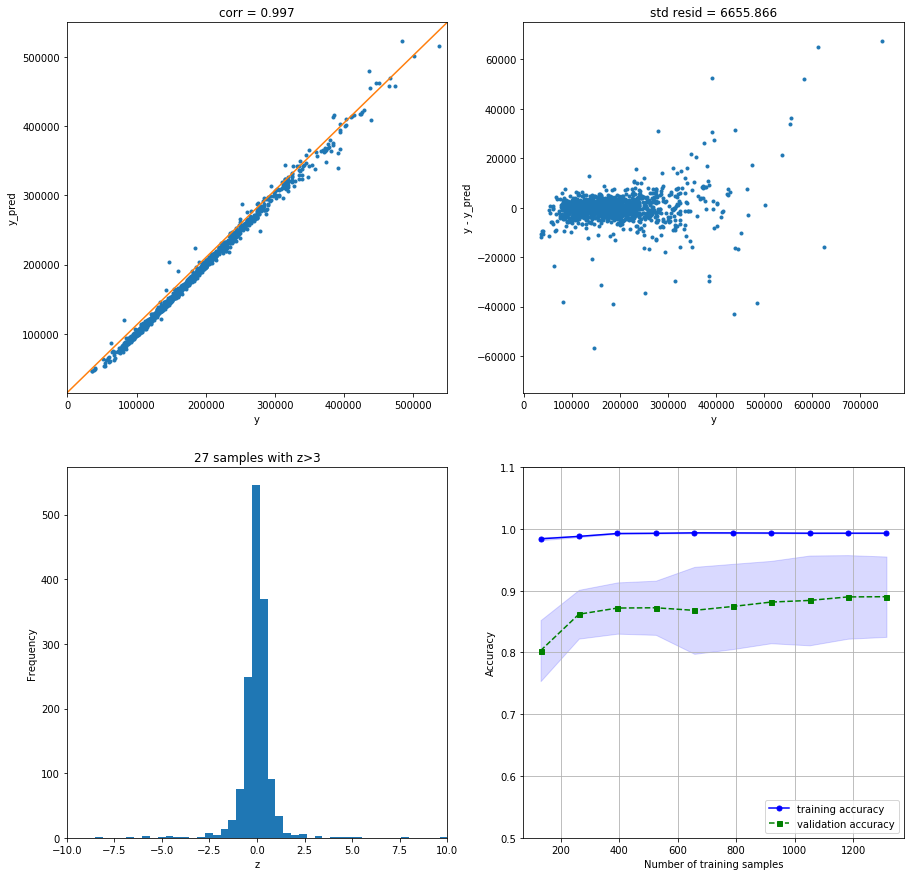

In [13]:
# best model with feature engineering

from sklearn.linear_model import LassoLarsCV
from sklearn.ensemble import ExtraTreesRegressor,GradientBoostingRegressor
from sklearn.pipeline import make_pipeline
from tpot.builtins import StackingEstimator

exported_pipeline = make_pipeline(
    StackingEstimator(estimator=LassoLarsCV(normalize=False)),
    StackingEstimator(estimator=GradientBoostingRegressor(alpha=0.85, learning_rate=0.1, loss="huber", max_depth=10, max_features=0.15000000000000002, min_samples_leaf=20, min_samples_split=8, n_estimators=100, subsample=0.7000000000000001)),
    ExtraTreesRegressor(bootstrap=False, max_features=0.6000000000000001, min_samples_leaf=1, min_samples_split=10, n_estimators=100)
)


score_models,model = fit_train(exported_pipeline,X_train,y_train,'Best_eng_model',score_models)


----------------------
LassoLarsCV(copy_X=True, cv='warn', eps=2.220446049250313e-16,
      fit_intercept=True, max_iter=500, max_n_alphas=1000, n_jobs=None,
      normalize=False, positive=False, precompute='auto', verbose=False)
----------------------
cross_val: mean= 0.1576657145127045 , std= 0.019437089354083194
18 outliers:
[178, 377, 440, 473, 523, 588, 632, 664, 688, 691, 803, 898, 1046, 1169, 1181, 1182, 1298, 1324]


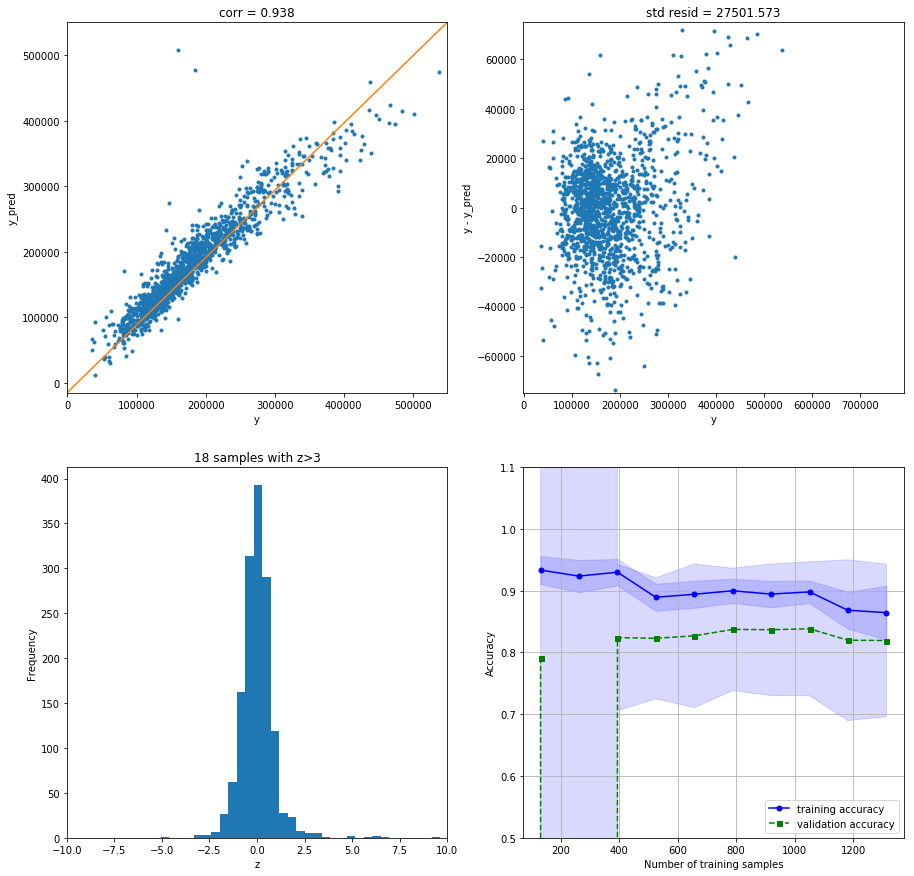

In [14]:
# first stacked layer - building the distribution with lasso, residuals pretty far off

lasso = LassoLarsCV(normalize=False)

score_models,model = fit_train(lasso,X_train,y_train,'Lassolars',score_models)

In [17]:
# too long to render 

"""explainer = shap.LinearExplainer(model,X_train)
shap_values_lasso = explainer.shap_values(X_train)
"""

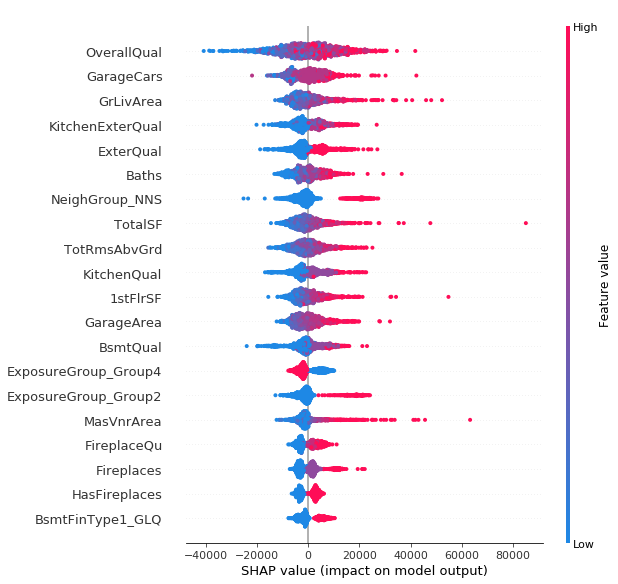

In [18]:
# shap values as expectedfor first layer
# note engineered features are popping up in top 20

shap.summary_plot(shap_values_lasso,X_train)

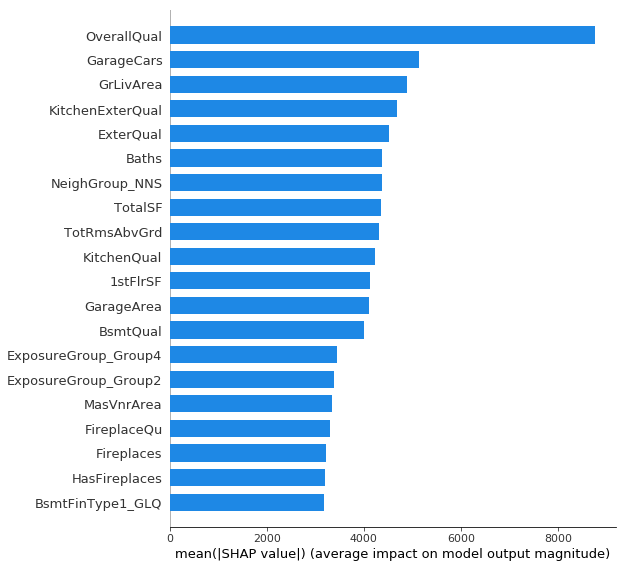

In [19]:
# top importances

shap.summary_plot(shap_values_lasso,X_train,plot_type="bar")

In [20]:
# let us look at the same records we predicted on the first model, seems to be behaving ok

shap.force_plot(explainer.expected_value,shap_values_lasso[1182],X_train.iloc[1182,:])

In [21]:
# low level prediction, seems to be behaving ok

shap.force_plot(explainer.expected_value,shap_values_lasso[29],X_train.iloc[29,:])

In [22]:
# mid level prediction, seems to be behaving ok

shap.force_plot(explainer.expected_value,shap_values_lasso[961],X_train.iloc[961,:])

In [23]:
# take prediction and take to next level after plotting distribution below

lasso_pred = model.predict(X_train)
lasso_pred = pd.DataFrame(lasso_pred)
X_train_eng_comb = pd.concat([X_train,lasso_pred],axis=1)
X_train_eng_comb.rename(columns={0:'lasso generalizer'},inplace=True)
X_train_eng_comb.head(5)


,TotalSF,OverallQual,KitchenExterQual,GrLivArea,TotalBsmtSF,GarageArea,GarageCars,Baths,ExterQual,KitchenQual,...,Condition2_Norm,BsmtFinSF2,Exterior1st_WdShing,Neighborhood_MeadowV,MSSubClass_40,Condition2_PosA,BsmtFinType2_Rec,LowQualFinSF,RoofStyle_Gambrel,lasso generalizer
0,2566.0,7,8.0,1710,856.0,548.0,2.0,3.5,4,4.0,...,1,0.0,0,0,0,0,0,0,0,210184.836601
1,2524.0,6,6.0,1262,1262.0,460.0,2.0,2.5,3,3.0,...,1,0.0,0,0,0,0,0,0,0,211293.716708
2,2706.0,7,8.0,1786,920.0,608.0,2.0,3.5,4,4.0,...,1,0.0,0,0,0,0,0,0,0,212192.009589
3,2473.0,7,7.0,1717,756.0,642.0,3.0,2.0,3,4.0,...,1,0.0,0,0,0,0,0,0,0,185289.816673
4,3343.0,8,8.0,2198,1145.0,836.0,3.0,3.5,4,4.0,...,1,0.0,0,0,0,0,0,0,0,313864.378050


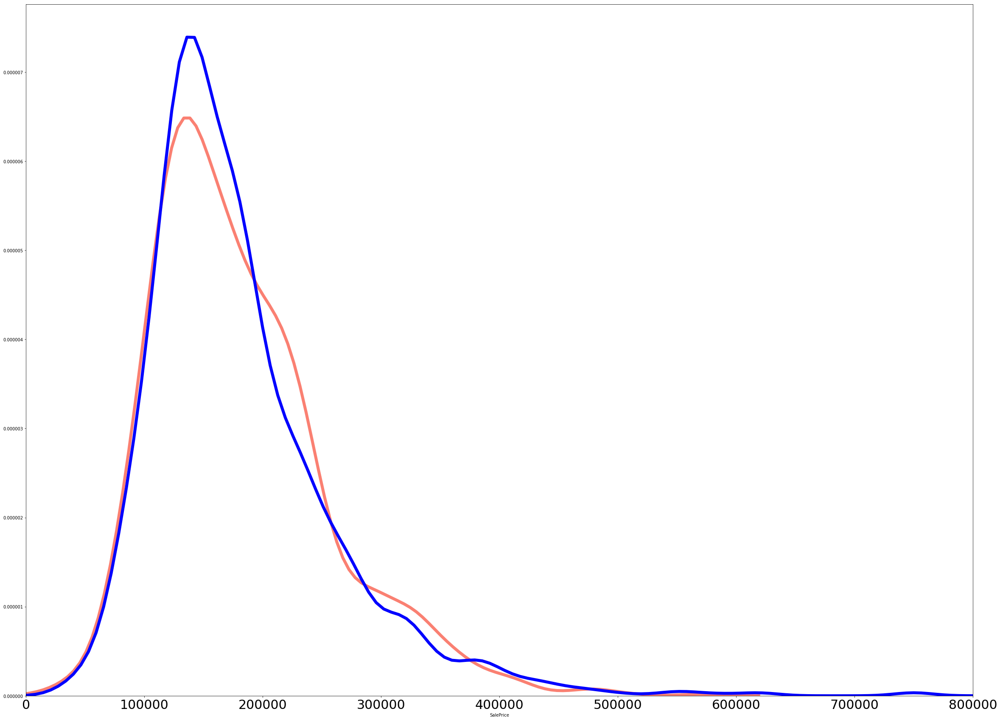

In [26]:
# blue distribution is y_train
# salmon distribution is the lasso output 
# note the first distrbution is close to matching y-train but still off

plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(lasso_pred,color="salmon",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))

----------------------
GradientBoostingRegressor(alpha=0.85, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='huber', max_depth=10,
             max_features=0.15000000000000002, max_leaf_nodes=None,
             min_impurity_decrease=0.0, min_impurity_split=None,
             min_samples_leaf=20, min_samples_split=8,
             min_weight_fraction_leaf=0.0, n_estimators=100,
             n_iter_no_change=None, presort='auto', random_state=None,
             subsample=0.7000000000000001, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False)
----------------------
cross_val: mean= 0.12347486765958386 , std= 0.01613496287502112
19 outliers:
[185, 313, 440, 496, 523, 581, 588, 632, 688, 691, 769, 803, 898, 1046, 1169, 1181, 1182, 1298, 1324]


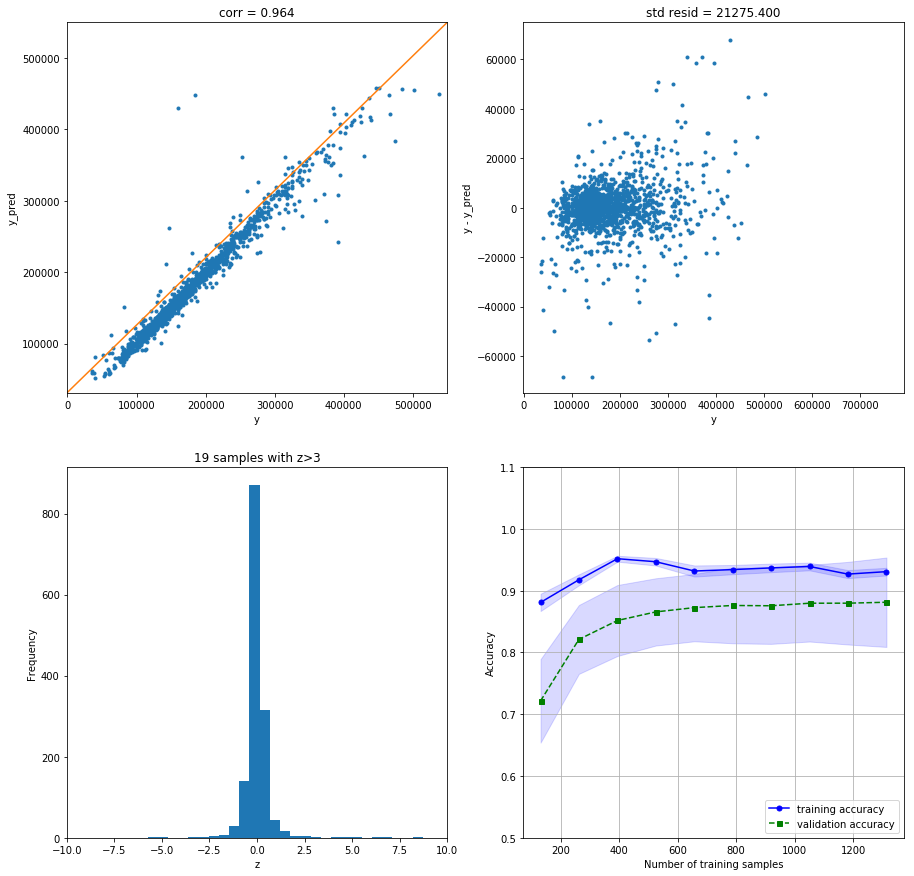

In [27]:
# build second model with gb and look at residuals - slightly better
# note learning rate is rather good

gb =GradientBoostingRegressor(alpha=0.85, learning_rate=0.1, loss="huber",
                              max_depth=10, max_features=0.15000000000000002, min_samples_leaf=20, min_samples_split=8,
                              n_estimators=100, subsample=0.7000000000000001)

score_models,model = fit_train(gb,X_train_eng_comb,y_train,'Gb',score_models)


In [ ]:
# build explainer - too long to show in nb
"""
def gb_predict(data_asarray):
    data_asframe =  pd.DataFrame(data_asarray, columns=X_train_eng_comb.columns.tolist())
    return model.predict(data_asframe)

shap_kernel_explainer = shap.KernelExplainer(gb_predict, X_train_eng_comb)
shap_values_gb2 = shap_kernel_explainer.shap_values(X_train_eng_comb,nsamples=1000)
"""

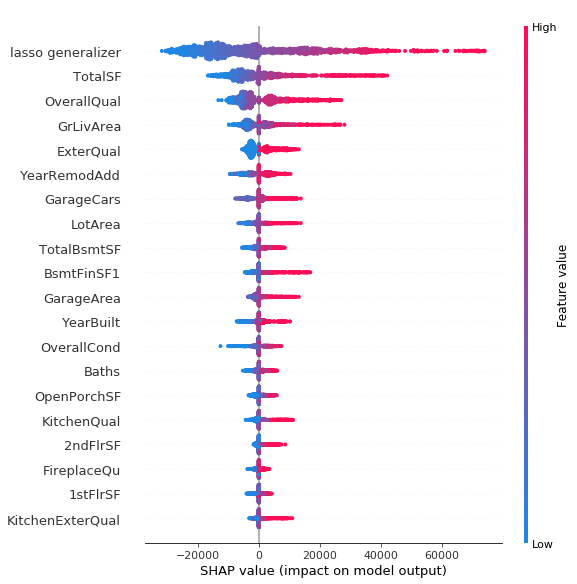

In [29]:
# lasso predictor is the most important. it has encoded other variables which have dropped off
# most , if not all of the engineered variables encoded into the lasso generalizer

shap.summary_plot(shap_values_gb2,X_train_eng_comb)

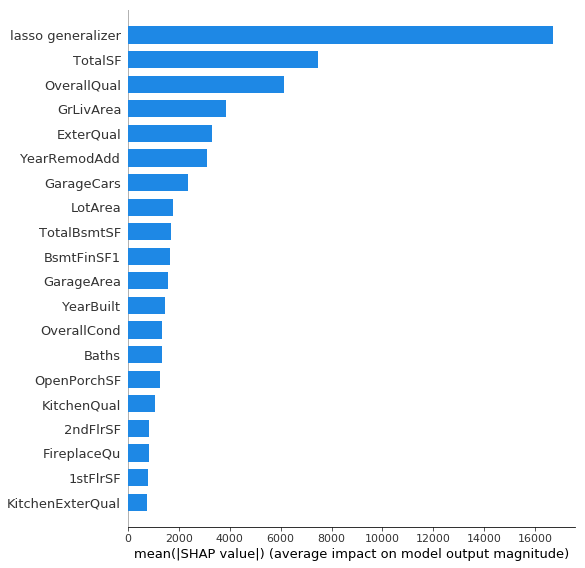

In [30]:
# top variables

shap.summary_plot(shap_values_gb2,X_train_eng_comb,plot_type="bar")

In [31]:
# let us look at the same records we predicted on the first model

shap.force_plot(explainer.expected_value,shap_values_gb2[1182],X_train_eng_comb.iloc[1182,:])

In [32]:
# low level prediction

shap.force_plot(explainer.expected_value,shap_values_gb2[29],X_train_eng_comb.iloc[29,:])

In [33]:
# mid level prediction

shap.force_plot(explainer.expected_value,shap_values_gb2[961],X_train_eng_comb.iloc[961,:])

In [35]:
# combine ridge prediction + gb correction term

gb_pred = model.predict(X_train_eng_comb)
gb_pred = pd.DataFrame(gb_pred)
X_train_eng_comb2 = pd.concat([X_train_eng_comb,gb_pred],axis=1)
X_train_eng_comb2.rename(columns = {0:'GB generalizer'},inplace=True)
X_train_eng_comb2.head(5)

,TotalSF,OverallQual,KitchenExterQual,GrLivArea,TotalBsmtSF,GarageArea,GarageCars,Baths,ExterQual,KitchenQual,...,BsmtFinSF2,Exterior1st_WdShing,Neighborhood_MeadowV,MSSubClass_40,Condition2_PosA,BsmtFinType2_Rec,LowQualFinSF,RoofStyle_Gambrel,lasso generalizer,GB generalizer
0,2566.0,7,8.0,1710,856.0,548.0,2.0,3.5,4,4.0,...,0.0,0,0,0,0,0,0,0,210184.836601,207017.536255
1,2524.0,6,6.0,1262,1262.0,460.0,2.0,2.5,3,3.0,...,0.0,0,0,0,0,0,0,0,211293.716708,186226.469618
2,2706.0,7,8.0,1786,920.0,608.0,2.0,3.5,4,4.0,...,0.0,0,0,0,0,0,0,0,212192.009589,222444.684837
3,2473.0,7,7.0,1717,756.0,642.0,3.0,2.0,3,4.0,...,0.0,0,0,0,0,0,0,0,185289.816673,157484.498067
4,3343.0,8,8.0,2198,1145.0,836.0,3.0,3.5,4,4.0,...,0.0,0,0,0,0,0,0,0,313864.378050,279418.230826


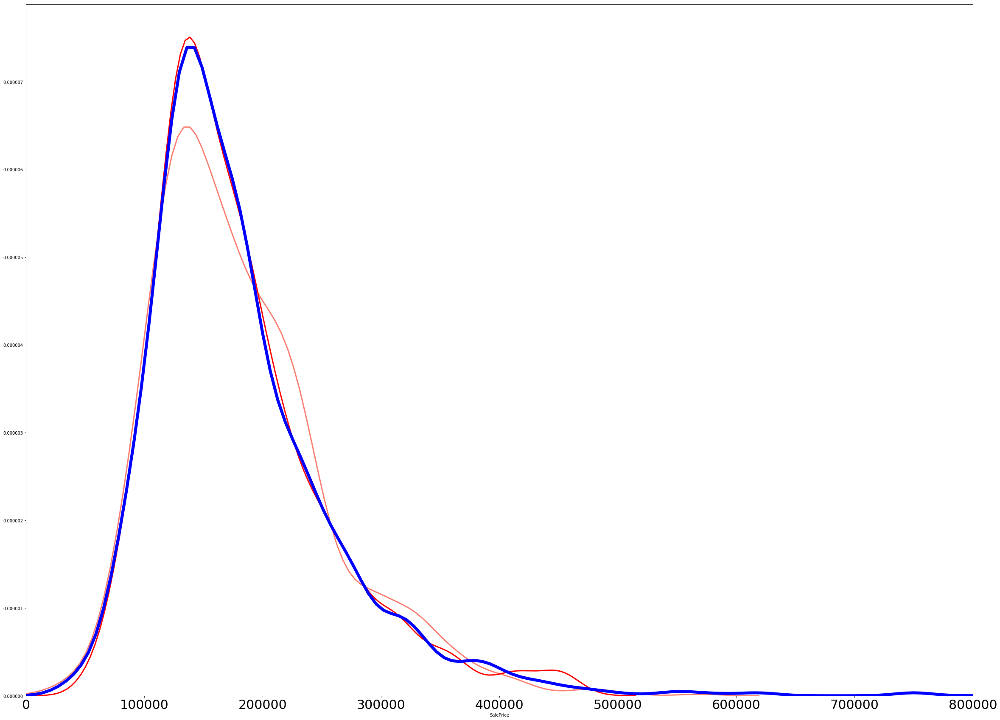

In [45]:
# blue distribution the y_train
# salmon is lasso
# red is gb prediction, corrected upon the lasso output

plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(lasso_pred,color="salmon",hist=False,  kde_kws=dict( linewidth= 3))
sns.distplot(gb_pred,color="red",hist=False, kde_kws=dict( linewidth= 3))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))


----------------------
ExtraTreesRegressor(bootstrap=False, criterion='mse', max_depth=None,
          max_features=0.6000000000000001, max_leaf_nodes=None,
          min_impurity_decrease=0.0, min_impurity_split=None,
          min_samples_leaf=1, min_samples_split=10,
          min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
          oob_score=False, random_state=None, verbose=0, warm_start=False)
----------------------
cross_val: mean= 0.0889456592006058 , std= 0.020012409594544856
27 outliers:
[4, 13, 58, 112, 224, 313, 349, 440, 473, 527, 581, 632, 644, 688, 691, 774, 798, 803, 825, 898, 1046, 1169, 1181, 1182, 1298, 1324, 1359]


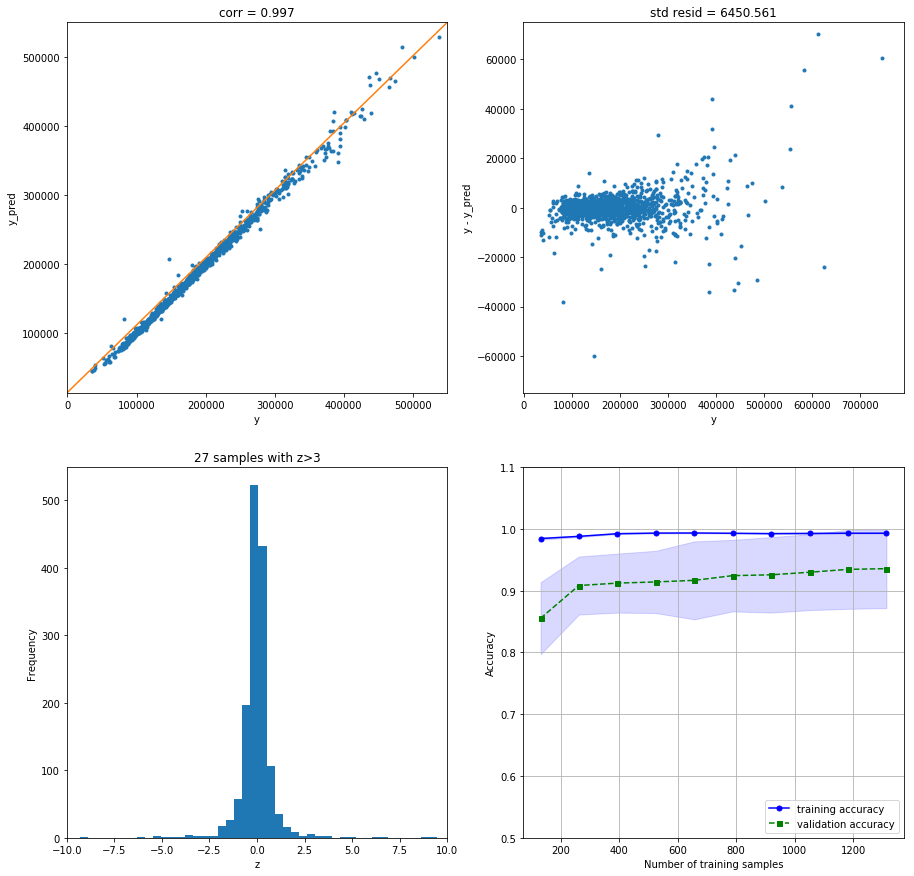

In [36]:
# extra trees regressor, best performance from a std residual perspective
# learning rate better than the final model without feature engineering

ex =   ExtraTreesRegressor(bootstrap=False, max_features=0.6000000000000001, min_samples_leaf=1, min_samples_split=10, n_estimators=100)

score_models,model = fit_train(ex,X_train_eng_comb2,y_train,'Extra',score_models)

In [ ]:
# explain the final stacked model - too long to show in nb

"""

def ex_predict(data_asarray):
    data_asframe =  pd.DataFrame(data_asarray, columns=X_train_eng_comb2.columns.tolist())
    return model.predict(data_asframe)

shap_kernel_explainer = shap.KernelExplainer(ex_predict, X_train_eng_comb2)
shap_values_ex = shap_kernel_explainer.shap_values(X_train_eng_comb2,nsamples=1000)
"""

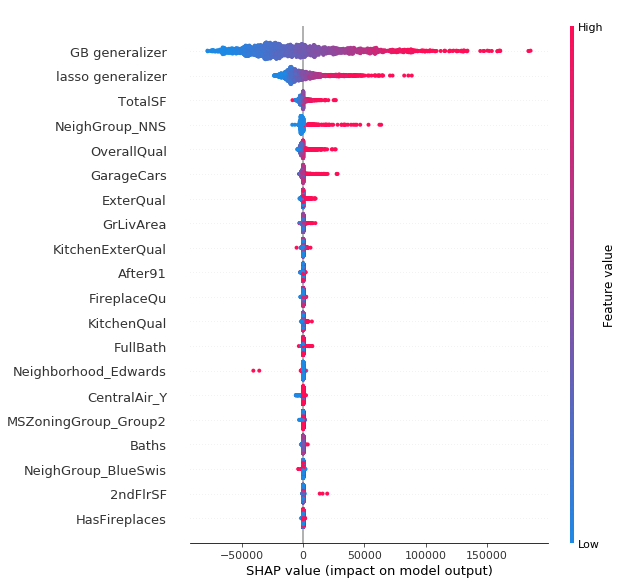

In [38]:
# top variables are GB variable and lasso model
# as compared to first model, there are interactions below the first 2 predictions that contribute to the output

shap.summary_plot(shap_values_ex,X_train_eng_comb2)

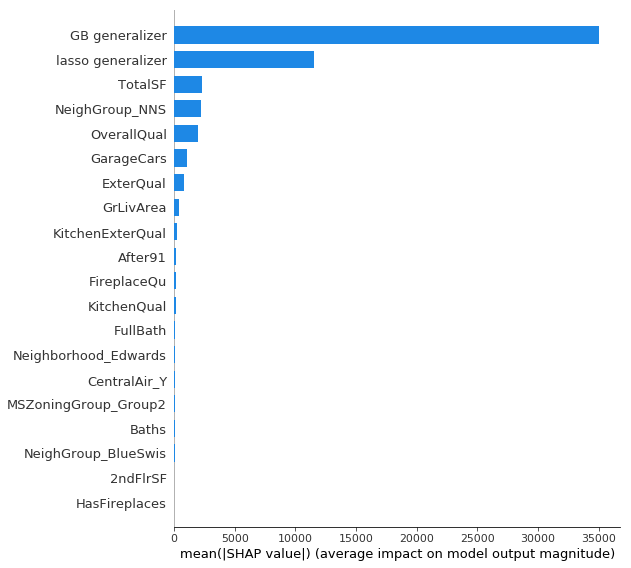

In [39]:
# top variables, it has encoded most of the other variables into the first 2 predictors

shap.summary_plot(shap_values_ex,X_train_eng_comb2,plot_type="bar")

In [40]:
# let us look at the same records we predicted on the first model, predicted value for 1182 stailized a bit more 


shap.force_plot(explainer.expected_value,shap_values_ex[1182],X_train_eng_comb2.iloc[1182,:])

In [41]:
# low level prediction
# stabilized a bit more, not ALL the 2 predictors variables as in the first model

shap.force_plot(explainer.expected_value,shap_values_ex[29],X_train_eng_comb2.iloc[29,:])

In [42]:
# mid level prediction
# also stabilized

shap.force_plot(explainer.expected_value,shap_values_ex[961],X_train_eng_comb2.iloc[961,:])

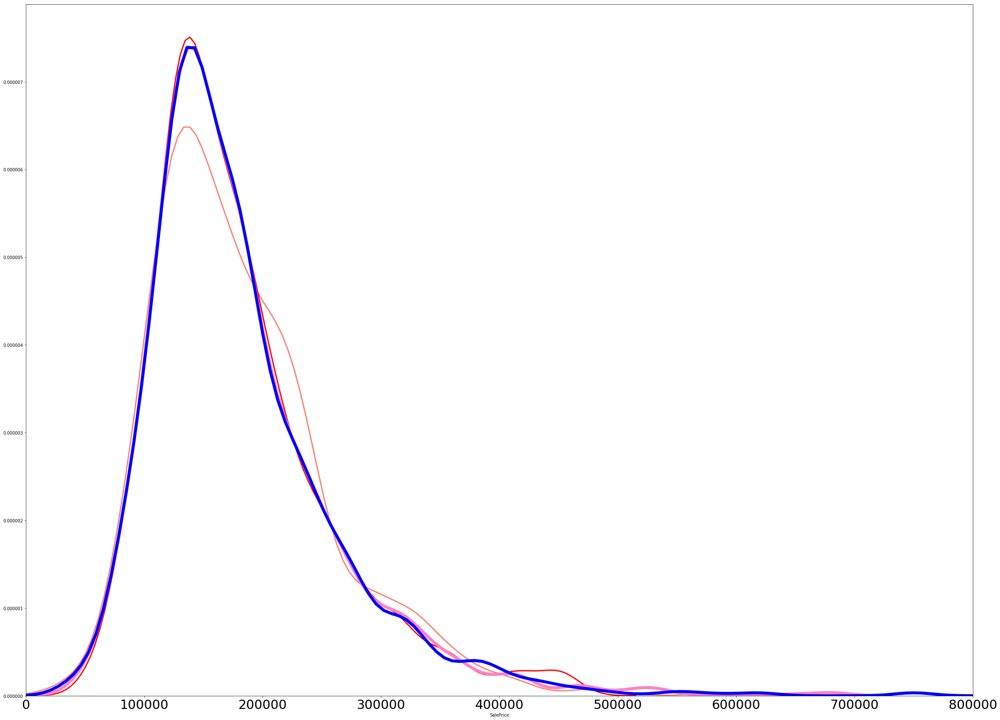

In [48]:
# predict last variable and show outputted distribution

ex_pred = model.predict(X_train_eng_comb2)

# plot - can barely see pink line - we will plot those next

plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(lasso_pred,color="salmon",hist=False,  kde_kws=dict( linewidth= 3))
sns.distplot(gb_pred,color="red",hist=False, kde_kws=dict( linewidth= 3))
sns.distplot(ex_pred,color="xkcd:pink",hist=False, kde_kws=dict( linewidth= 7))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 7))



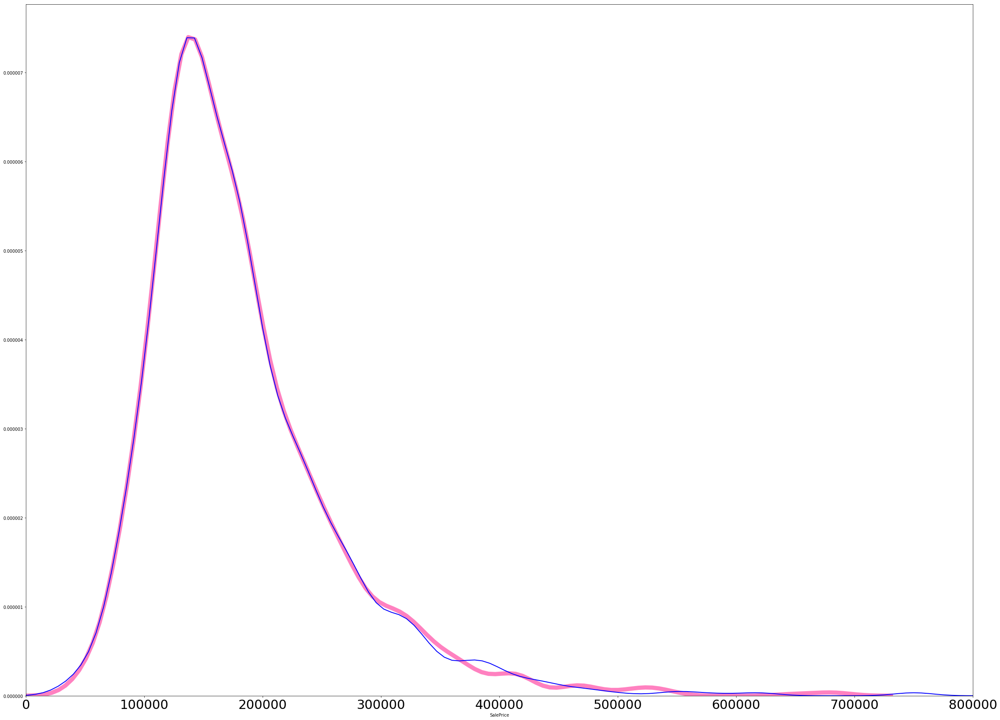

In [52]:
# almost matched to a T - next we will see test prediction

plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(ex_pred,color="xkcd:pink",hist=False, kde_kws=dict( linewidth=10))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 2))


In [59]:
# run the same predictions on test set and plot

lasso = LassoLarsCV(normalize=False)
lasso.fit(X_train,y_train)

X_test = X_test.reset_index(drop=True)

lasso_pred_test = lasso.predict(X_test)
lasso_pred_test = pd.DataFrame(lasso_pred_test)
X_test_eng_comb = pd.concat([X_test,lasso_pred_test],axis=1)
X_test_eng_comb.rename(columns={0:'Lasso generalizer'},inplace=True)

gb =GradientBoostingRegressor(alpha=0.85, learning_rate=0.1, loss="huber",
                              max_depth=10, max_features=0.15000000000000002, min_samples_leaf=20, min_samples_split=8,
                              n_estimators=100, subsample=0.7000000000000001)

gb.fit(X_train_eng_comb,y_train)

gb_pred_test = gb.predict(X_test_eng_comb)
gb_pred_test = pd.DataFrame(gb_pred_test)
X_test_eng_comb2 = pd.concat([X_test_eng_comb,gb_pred_test],axis=1)
X_test_eng_comb2.rename(columns = {0:'GB generalizer'},inplace=True)

ex = ExtraTreesRegressor(bootstrap=False, max_features=0.6000000000000001, min_samples_leaf=1, min_samples_split=10, n_estimators=100)

ex.fit(X_train_eng_comb2,y_train)

ex_pred_test = ex.predict(X_test_eng_comb2)


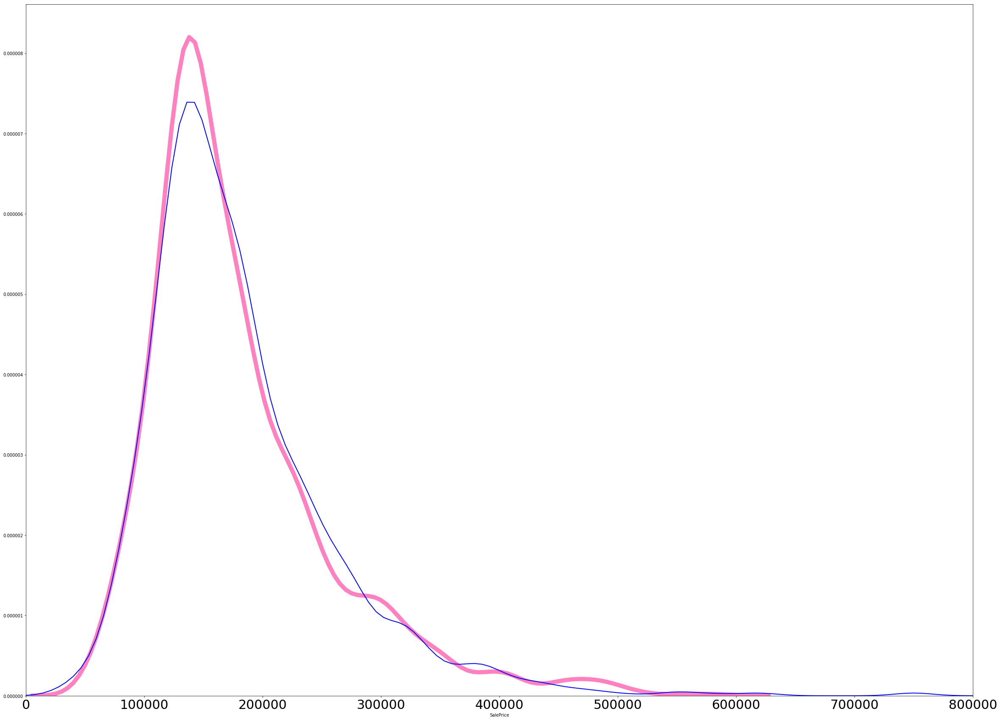

In [60]:
# plot y_train vs outputted X_test prediction
# generalizes pretty well against test per y

plt.figure(figsize=(40,30))
plt.xlim(left=0)
plt.xlim(right=800000)
plt.xticks(fontsize=30)
sns.distplot(ex_pred_test,color="xkcd:pink",hist=False, kde_kws=dict( linewidth=10))
plt.xlim(left=0)
plt.xlim(right=800000)
sns.distplot(y_train,color="blue",hist=False, kde_kws=dict( linewidth= 2))
